# CSE4062 Data Science - Delivery #4

## Göksel Tokur - 150116049

## Arda Bayram-150116029

## Gülnihal Erdem - 150319554

## İrem Seçmen - 170219006

In [1]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [3]:
# Read Data
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [4]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

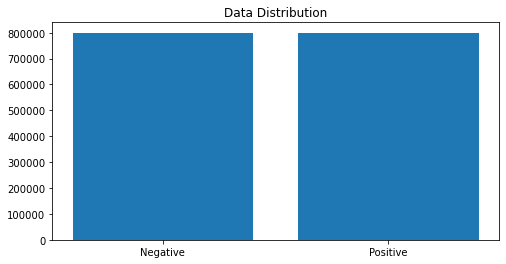

In [5]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [6]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ardab\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

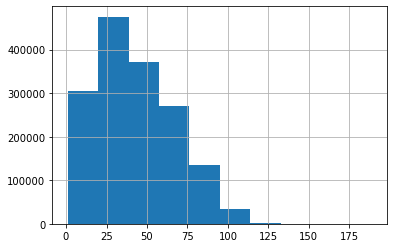

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [8]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [10]:
all_str = ""
for i in df.tweet:
    all_str += i

In [11]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


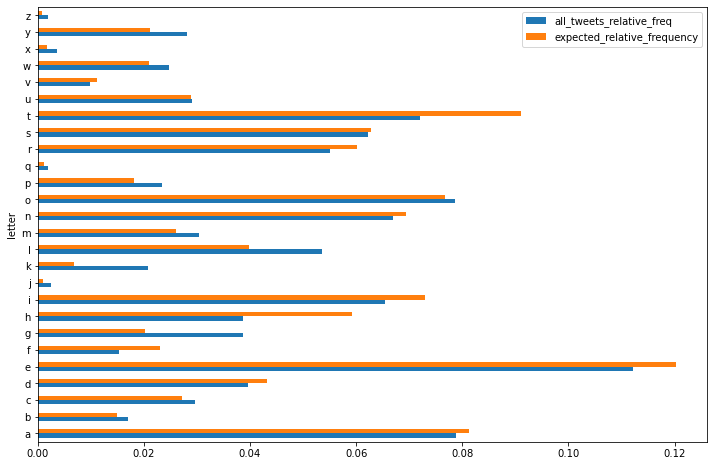

In [12]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [13]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [14]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [15]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [16]:
df1.number_of_characters.max()

189

In [17]:
df1.number_of_characters.min()

1

In [18]:
df1.number_of_characters.mean()

42.7974010379771

In [19]:
df1.number_of_characters.std()

24.15896165070398

## Number of Words

In [20]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [21]:
df1.number_of_words.max()

50

In [22]:
df1.number_of_words.min()

1

In [23]:
df1.number_of_words.mean()

7.244474128445898

In [24]:
df1.number_of_words.std()

4.030421805717334

### Positives + Negatives

<BarContainer object of 20 artists>

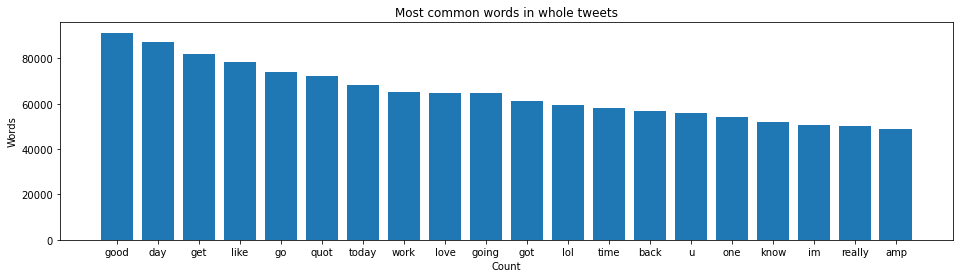

In [25]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

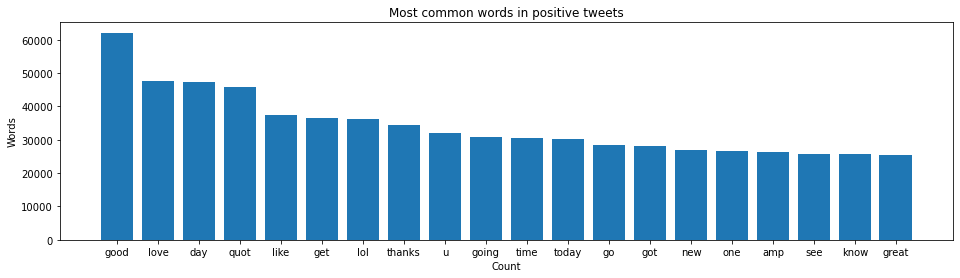

In [26]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

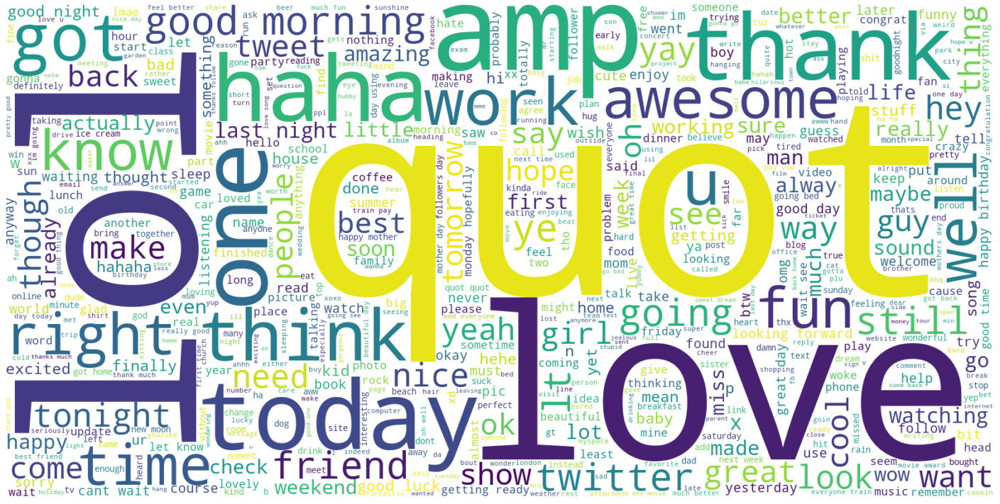

In [27]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

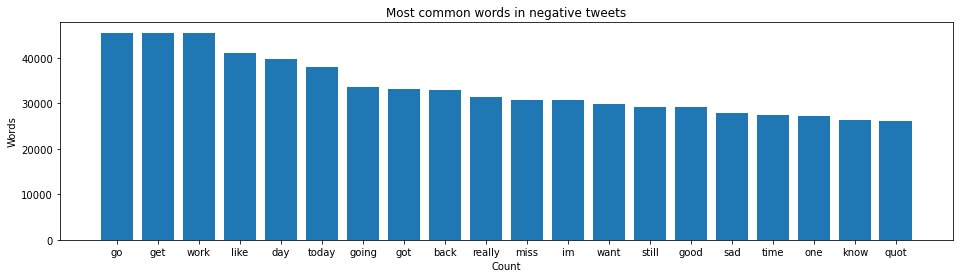

In [28]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

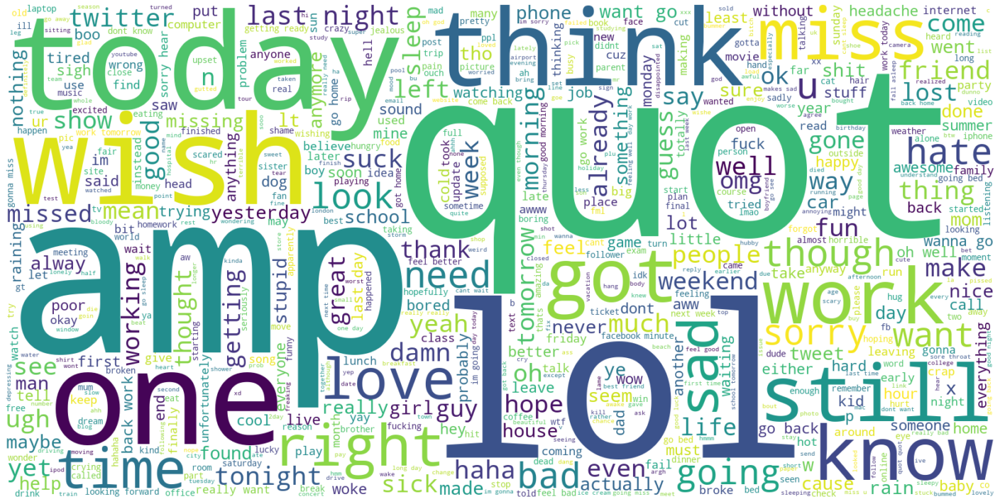

In [29]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [30]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [31]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [32]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Vocabulary Size : 290458


In [33]:
from keras.preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [34]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [35]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [36]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [37]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '0010utc',
 '007',
 '00pm',
 '01',
 '02',
 '0255',
 '02x02',
 '03',
 '04',
 '04182012154',
 '0430',
 '05',
 '0530',
 '05am',
 '06',
 '0600',
 '0659',
 '08',
 '09',
 '09am',
 '0d',
 '0ne',
 '0ppm',
 '0t',
 '10',
 '100',
 '1000',
 '1000000000',
 '100k',
 '100lb',
 '100m',
 '100rmb',
 '100th',
 '101',
 '103',
 '104',
 '1040',
 '105',
 '106',
 '1080p',
 '1096',
 '10am',
 '10hrs',
 '10k',
 '10lb',
 '10mg',
 '10mins',
 '10minutes',
 '10p',
 '10pm',
 '10s',
 '10th',
 '11',
 '110',
 '11111111111111111111111111111111200',
 '112',
 '1159am',
 '116',
 '118',
 '11am',
 '11pm',
 '11ppl',
 '11th',
 '12',
 '120',
 '1200',
 '12086',
 '1230',
 '1234',
 '125',
 '12am',
 '12dp',
 '12hours',
 '12hrs',
 '12ish',
 '12pm',
 '12th',
 '12y',
 '13',
 '1300',
 '131',
 '134',
 '1350',
 '135th',
 '138',
 '13hr',
 '13th',
 '14',
 '140',
 '1404',
 '140char',
 '140conf',
 '140tc',
 '140tees',
 '14301',
 '145',
 '14k',
 '14o',
 '14th',
 '15',
 '150',
 '1500',
 '1500th',
 '15hours',
 '15km',
 '15mins',


In [38]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [39]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

need honey miss much wish could right
[0 0 0 ... 0 0 0]
wii fit friend kezzzzzzzzzzzz
[0 0 0 ... 0 0 0]
supposed go party bus tonight dont thats gonna happen
[0 0 0 ... 0 0 0]
told u play footy u didnt believe
[0 0 0 ... 0 0 0]
think found next apartment tell wonderful landlords leaving love
[0 0 0 ... 0 0 0]
sounds awesome e mail
[0 0 0 ... 0 0 0]
sometimes curse fact 24hr amp food shop 100m door resisting temptation 4am one strong ponts
[0 0 0 ... 0 0 0]
today fun got spend time nephews oh yeah coloring much fun
[0 0 0 ... 0 0 0]
greys anatomy fuckn awesome atm
[0 0 0 ... 0 0 0]
sadly beer festivals must end
[0 0 0 ... 0 0 0]
welcome mate
[0 0 0 ... 0 0 0]
oooh show talk
[0 0 0 ... 0 0 0]
highly recommends join www m2e asia earn money free shareholder dividends even nothing
[0 0 0 ... 0 0 0]
man yet cant wait 2 nite drinks pool side n relaxation
[0 0 0 ... 0 0 0]
made shenzhen bus onto island next 100rmb 40min cab hostel li l cloudy 72f
[0 0 0 ... 0 0 0]
part till ya pass drink till 

[0 0 0 ... 0 0 0]
hope feels better soon hate get fevers
[0 0 0 ... 0 0 0]
sep 8 aargghhh must wait patiently hard enough
[0 0 0 ... 0 0 0]
bottom itunes vouchers says quite bluntly quot steal music quot
[0 0 0 ... 0 0 0]
omggg met keri gonna ask take long 2 end didnt enough time
[0 0 0 ... 0 0 0]
traffic school goes saturday
[0 0 0 ... 0 0 0]
lol u make one random messages even though friends make random messages 2 lol
[0 0 0 ... 0 0 0]
got home greatt dayy got nails yoo
[0 0 0 ... 0 0 0]
feeling old fact grew billy idol duran duran ha police omg
[0 0 0 ... 0 0 0]
gadfly early late
[0 0 0 ... 0 0 0]
good day mind definitely needs
[0 0 0 ... 0 0 0]
thank weekend going good getting beautiful rain
[0 0 0 ... 0 0 0]
email problems last week emailed bounced please send fixed
[0 0 0 ... 0 0 0]
wish media quote iran state tv propaganda iranelection
[0 0 0 ... 0 0 0]
omg im getting sick lil traes video shoot tomorrow check details myspace com hfeliltrae wont able 2 enjoy
[0 0 0 ... 0 0 0]
gre

[0 0 0 ... 0 0 0]
fun states
[0 0 0 ... 0 0 0]
oh hai thad iphone twitter apps try twitterific tweetie
[0 0 0 ... 0 0 0]
food inc amazing sickengly frightfully honest must see avoid company monsanto like plague
[0 0 0 ... 0 0 0]
good friend cyndi wanted volunteer lives canada
[0 0 0 ... 0 0 0]
creepy guy leakycon
[0 0 0 ... 0 0 0]
tonight forbidden underworld got permission film anyone knows give em poke
[0 0 0 ... 0 0 0]
first speeding ticket
[0 0 0 ... 0 0 0]
good morning girlie woke buit still early cause went bed 4am wanna go back dream jon
[0 0 0 ... 0 0 0]
good morning miss cely le ste mucho
[0 0 0 ... 0 0 0]
quot cor warm quot haha hope ok ellie xx
[0 0 0 ... 0 0 0]
work saturday morning
[0 0 0 ... 0 0 0]
u hear one eyed scottish comment jeremy clarkson gordon brown saw youtube
[0 0 0 ... 0 0 0]
goodnight
[0 0 0 ... 0 0 0]
anywhere near catholic perspective quot divine conspiracy quot dallas willard heady reading lovely
[0 0 0 ... 0 0 0]
im going instruments sounds 40 minutes st

wanna play dogs asleep
[0 0 0 ... 0 0 0]
yeah gotten day weird
[0 0 0 ... 0 0 0]
im going drive today checking 4 5 horses weather quite nice long time see miss liten xoxo
[0 0 0 ... 0 0 0]
fresh mint leaves taste really effing good freshly brewed jasmine tea
[0 0 0 ... 0 0 0]
nothing today
[0 0 0 ... 0 0 0]
heat love caribbean
[0 0 0 ... 0 0 0]
thats cool
[0 0 0 ... 0 0 0]
oh luck watching gg cheap therapy episode w cris rose lucky day yes nerd shut
[0 0 0 ... 0 0 0]
yay one home yay im roll homework fun saturday
[0 0 0 ... 0 0 0]
may figuring twitter thing cept phone registered yet
[0 0 0 ... 0 0 0]
please pray grandpa
[0 0 0 ... 0 0 0]
oh yeah put disclaimer distance selling therefore need abide rules
[0 0 0 ... 0 0 0]
younger stevie g adorable
[0 0 0 ... 0 0 0]
good time prom played jonas brothers pretty much made night
[0 0 0 ... 0 0 0]
balls hurt long bike ride
[0 0 0 ... 0 0 0]
need sleep soooooooooo bad 5 30am corn sake bastard earache hurts bad
[0 0 0 ... 0 0 0]
jon kate plus e

[0 0 0 ... 0 0 0]
nope
[0 0 0 ... 0 0 0]
lol really wanna go forest concert notts cant affored bummer xx
[0 0 0 ... 0 0 0]
good morning ny tweeters woke n good thing alarm go oops
[0 0 0 ... 0 0 0]
awww peggy improving
[0 0 0 ... 0 0 0]
cant believe bbc dont grand prix hd
[0 0 0 ... 0 0 0]
would need help shoot send u resume amp extra hand always helpful
[0 0 0 ... 0 0 0]
poor chicken
[0 0 0 ... 0 0 0]
noahs arc jumping broom cute movie colection complete
[0 0 0 ... 0 0 0]
yess know missing picnic
[0 0 0 ... 0 0 0]
uhhh freshly baked bread go perfectly earlier cooking today
[0 0 0 ... 0 0 0]
thanksss
[0 0 0 ... 0 0 0]
still work 3 hours ryan came store surprised latte best boyfriend ever xoxoxo
[0 0 0 ... 0 0 0]
thinks got even think sleep
[0 0 0 ... 0 0 0]
ahhh never blushed much life
[0 0 0 ... 0 0 0]
blog roll
[0 0 0 ... 0 0 0]
river happy love incredible beautiful babe planet n life forever 100 dedicated
[0 0 0 ... 0 0 0]
good quot morning quot twitter ers
[0 0 0 ... 0 0 0]
geoip f

ate dinner family nc amp va much fun got back pool g wasnt
[0 0 0 ... 0 0 0]
hot waters run continue c wk ergh graphics poop gotta wait water warm
[0 0 0 ... 0 0 0]
soon going germany one hour left
[0 0 0 ... 0 0 0]
sweet
[0 0 0 ... 0 0 0]
good morning twitter friends
[0 0 0 ... 0 0 0]
agree 100 sad see gigs great music empty hope blast
[0 0 0 ... 0 0 0]
home six flags discovery kingdom tired little sunburned
[0 0 0 ... 0 0 0]
finally think narcolepsy swear haha hope every1 good day
[0 0 0 ... 0 0 0]
stressed culminatings
[0 0 0 ... 0 0 0]
oh ok ignore
[0 0 0 ... 0 0 0]
know time lol
[0 0 0 ... 0 0 0]
thank advancedbrain heykim 26 visiting friend tells nice young man still shock
[0 0 0 ... 0 0 0]
tomorrow first exam dutch pretty nervous
[0 0 0 ... 0 0 0]
way 2 set 4 2day shoot eaten yet 2day soooo hungry
[0 0 0 ... 0 0 0]
lost followerz follow agen plz
[0 0 0 ... 0 0 0]
getting sick reading internet posts using word substitute sure better things
[0 0 0 ... 0 0 0]
fallen trap forgive
[0

[0 0 0 ... 0 0 0]
ugh worst feeling worry something better come
[0 0 0 ... 0 0 0]
proud working 6 hours still going
[0 0 0 ... 0 0 0]
woo get see ftd 1st time forever holiday last time well
[0 0 0 ... 0 0 0]
haha ooh yea thanks
[0 0 0 ... 0 0 0]
like new set buzznet
[0 0 0 ... 0 0 0]
hotter ever abandon garden office today
[0 0 0 ... 0 0 0]
ross lovely shame 3gs us
[0 0 0 ... 0 0 0]
sitting home like always nothing friends job soon wish hollywood tough
[0 0 0 ... 0 0 0]
bookthingo ah quot vapid quot love vocabulary ladies would said quot feckwit quot
[0 0 0 ... 0 0 0]
love guys death bother
[0 0 0 ... 0 0 0]
thank u
[0 0 0 ... 0 0 0]
lt ej think grace belongs grace sami gt grace sami sorting rest hurts brain much
[0 0 0 ... 0 0 0]
close yet far sutil amp force india shanghai
[0 0 0 ... 0 0 0]
im stating late humanly possible since last time week
[0 0 0 ... 0 0 0]
dont know think ive pulled muscle back
[0 0 0 ... 0 0 0]
one always working oh yeah still
[0 0 0 ... 0 0 0]
yuvipanda imo 15

[0 0 0 ... 0 0 0]
called twice
[0 0 0 ... 0 0 0]
officially soul destroying thing world writing four pages needing new piece paper conclusion
[0 0 0 ... 0 0 0]
u went mia meee
[0 0 0 ... 0 0 0]
ready new
[0 0 0 ... 0 0 0]
reading para kay b
[0 0 0 ... 0 0 0]
suckss
[0 0 0 ... 0 0 0]
reward may download free copy emailunlimited
[0 0 0 ... 0 0 0]
love guyssss
[0 0 0 ... 0 0 0]
tell change channel well wha happened
[0 0 0 ... 0 0 0]
agree wave ambitious succeeds event history remember
[0 0 0 ... 0 0 0]
post complaint teacher www teachercomplaints com tell friends students
[0 0 0 ... 0 0 0]
break leg tonight
[0 0 0 ... 0 0 0]
today gonna suck
[0 0 0 ... 0 0 0]
haha watched hope give shoutout
[0 0 0 ... 0 0 0]
sophies day potentialy pregnant rabbit haaa
[0 0 0 ... 0 0 0]
michael plank playing around unit testing flash builder 4 want unit testing fdt
[0 0 0 ... 0 0 0]
faith brings tears even years pains much tell know well
[0 0 0 ... 0 0 0]
gone gym
[0 0 0 ... 0 0 0]
really missin ddub love


[0 0 0 ... 0 0 0]
bored new oth eps watch
[0 0 0 ... 0 0 0]
want david archuleta quot teenage magazine quot thats singaporee
[0 0 0 ... 0 0 0]
amazing
[0 0 0 ... 0 0 0]
congrats shayla
[0 0 0 ... 0 0 0]
love comics improve blog look layout etc though kinda crappy right
[0 0 0 ... 0 0 0]
lol even think killing
[0 0 0 ... 0 0 0]
welcome
[0 0 0 ... 0 0 0]
wish go
[0 0 0 ... 0 0 0]
wtf wrong ym
[0 0 0 ... 0 0 0]
work 4 1st time week gona hurt
[0 0 0 ... 0 0 0]
listening jon amp oscar tg mixes rise robots wow
[0 0 0 ... 0 0 0]
thinks best animated movie world happy 3 low key
[0 0 0 ... 0 0 0]
good morning
[0 0 0 ... 0 0 0]
hates playpen
[0 0 0 ... 0 0 0]
dreamed store grace someone tried kidnap
[0 0 0 ... 0 0 0]
hi 3 25 sleep raining outside
[0 0 0 ... 0 0 0]
trying watch antm train reception sporadic
[0 0 0 ... 0 0 0]
sams buying new battery suburban
[0 0 0 ... 0 0 0]
climbing bed trying get rid nasy cough
[0 0 0 ... 0 0 0]
omen
[0 0 0 ... 0 0 0]
need help online business maybe handy tips 

heard news fam mesa az robbed reportedly due follower twitter careful u
[0 0 0 ... 0 0 0]
think facebook got hacked
[0 0 0 ... 0 0 0]
paper good silly mistake made lose 10 marks
[0 0 0 ... 0 0 0]
proverbs 15 33 smile heaps today changes lives
[0 0 0 ... 0 0 0]
texting back jerk
[0 0 0 ... 0 0 0]
prep speech social media kristiansund 2morrow gonna fun fresh examples new stuff
[0 0 0 ... 0 0 0]
hells yeah xd well get one cereals get soggy milk eat
[0 0 0 ... 0 0 0]
thanks followfriday love
[0 0 0 ... 0 0 0]
yay sunshine
[0 0 0 ... 0 0 0]
yeah guess yesterday started acting lol feels like 3 days
[0 0 0 ... 0 0 0]
oh forgot mention sis called join shopping kl assignment bitch
[0 0 0 ... 0 0 0]
sigh hate hear day
[0 0 0 ... 0 0 0]
wish instead work another hour even
[0 0 0 ... 0 0 0]
mad prison break done worst ending evar
[0 0 0 ... 0 0 0]
saw one gsd covered could stop crying bawled bawled
[0 0 0 ... 0 0 0]
gotta go love call mi casa cell still taken away
[0 0 0 ... 0 0 0]
status immediat

[0 0 0 ... 0 0 0]
understand u feel dont eat bad im lazy lol ive ths trip b4 knw limits
[0 0 0 ... 0 0 0]
sucks
[0 0 0 ... 0 0 0]
time get back assignment
[0 0 0 ... 0 0 0]
wnt sleep good night bloved tweet
[0 0 0 ... 0 0 0]
trey taking airport bye west coast
[0 0 0 ... 0 0 0]
expect anything less
[0 0 0 ... 0 0 0]
sons bitches put releases already bought
[0 0 0 ... 0 0 0]
morning morning though
[0 0 0 ... 0 0 0]
watched new videos congrats weight loss amp lucky going holiday xx
[0 0 0 ... 0 0 0]
bummeriffic
[0 0 0 ... 0 0 0]
listening ida maria better naked great song
[0 0 0 ... 0 0 0]
repas de quartier today freezing ass cold guacomole iced coronas boo hoo
[0 0 0 ... 0 0 0]
laying couch sick
[0 0 0 ... 0 0 0]
done high school
[0 0 0 ... 0 0 0]
interview went fantastically pretty sure got job find certain tomorrow
[0 0 0 ... 0 0 0]
morning birthday today sure gonna yet sure involve beer sunshine
[0 0 0 ... 0 0 0]
robertd 16 twicer ty well
[0 0 0 ... 0 0 0]
looked dont think u
[0 0 0 .

[0 0 0 ... 0 0 0]
hey problem irregular heart beat
[0 0 0 ... 0 0 0]
time paint nails pick outfit tomorrow thinking black
[0 0 0 ... 0 0 0]
thank u much
[0 0 0 ... 0 0 0]
almost day night know find lol
[0 0 0 ... 0 0 0]
dear twitter friends kind love
[0 0 0 ... 0 0 0]
attempted go running today discovered little lot shape
[0 0 0 ... 0 0 0]
depressed going mmvas
[0 0 0 ... 0 0 0]
360 ps3 love lol
[0 0 0 ... 0 0 0]
aaah jus dealing unexpected news sure make keep posted anything changes 2mor love
[0 0 0 ... 0 0 0]
wanted see drag hell idk go next weekend finally going sleep workin tomorrow goodnight
[0 0 0 ... 0 0 0]
haha neither new favourite
[0 0 0 ... 0 0 0]
please take away
[0 0 0 ... 0 0 0]
entrepreneurial wisdom necker island please share
[0 0 0 ... 0 0 0]
awwww missed
[0 0 0 ... 0 0 0]
awww taylor amp lucas cute
[0 0 0 ... 0 0 0]
something waste friday afternoon
[0 0 0 ... 0 0 0]
starting week smile great weekend friends beach jbr
[0 0 0 ... 0 0 0]
gonna start study keeps ending fa

hey wanted say wait new moon comes twilight amazing guys excellent job
[0 0 0 ... 0 0 0]
dinner cyma fun peole asia shoot
[0 0 0 ... 0 0 0]
oh hope feel better soon
[0 0 0 ... 0 0 0]
church w 2yo earn medal quiet till threw hands air screamed quot goal quot damn hockey
[0 0 0 ... 0 0 0]
yes blocked follows bye xx
[0 0 0 ... 0 0 0]
aaawww miss cat much hub allergic cannot one boo love cats
[0 0 0 ... 0 0 0]
sooo cannot afford get iphone
[0 0 0 ... 0 0 0]
restless mexico tomorrow gonna miss boyfriend long three weeks
[0 0 0 ... 0 0 0]
shsaheen win cried self sleep
[0 0 0 ... 0 0 0]
doesnt understand twitter anybody help x
[0 0 0 ... 0 0 0]
aw sucks hope eel better
[0 0 0 ... 0 0 0]
might miss class depressed
[0 0 0 ... 0 0 0]
back footy nice game watts cousin called robbo loser love robbo
[0 0 0 ... 0 0 0]
really dont want work want something productive
[0 0 0 ... 0 0 0]
nap already sounding like les says hi back
[0 0 0 ... 0 0 0]
quot jay z 99 problems problem 68 would gotten away meddl

twitpic space interesting thing us
[0 0 0 ... 0 0 0]
im bummed lol curse birthday plans strikes gr
[0 0 0 ... 0 0 0]
fucking looooooove britney shut fuck ballads shake poon us hahahah
[0 0 0 ... 0 0 0]
feeling weather
[0 0 0 ... 0 0 0]
lol play
[0 0 0 ... 0 0 0]
presets amazingg
[0 0 0 ... 0 0 0]
woke sad
[0 0 0 ... 0 0 0]
please sign free e mail newsletter tricia allow keep using twitter
[0 0 0 ... 0 0 0]
legs aching stadning alllllllllllllll day booo
[0 0 0 ... 0 0 0]
trying work outside laptop darn bright see screen
[0 0 0 ... 0 0 0]
hating life right meow
[0 0 0 ... 0 0 0]
theres always tomorrow
[0 0 0 ... 0 0 0]
thanks tho english well enough 2 communicate sure know extrovert
[0 0 0 ... 0 0 0]
wtf sounds like bug ipod making clicking noise stop
[0 0 0 ... 0 0 0]
thank dreading sky black standing measuring river yay sarcasm xd xx
[0 0 0 ... 0 0 0]
alrrright suppose share itttt squee
[0 0 0 ... 0 0 0]
hate feeling sick energy n cough crap day great way spend weeks
[0 0 0 ... 0 0 0]


[0 0 0 ... 0 0 0]
well look spiffy
[0 0 0 ... 0 0 0]
goood night gos james brown james green
[0 0 0 ... 0 0 0]
good luck meeting agents fine
[0 0 0 ... 0 0 0]
lol bad hair month heard rain free week since mid april
[0 0 0 ... 0 0 0]
trying economics work
[0 0 0 ... 0 0 0]
awesome time last night
[0 0 0 ... 0 0 0]
atleast work although quiet work got watch pens game
[0 0 0 ... 0 0 0]
playing new kitten help getting attached cute furry animals
[0 0 0 ... 0 0 0]
need new phone one startin really suck
[0 0 0 ... 0 0 0]
wish didnt eat icccecream soo fast
[0 0 0 ... 0 0 0]
blog smelly miss
[0 0 0 ... 0 0 0]
ah phone julie lt 33333
[0 0 0 ... 0 0 0]
life good food better
[0 0 0 ... 0 0 0]
try every day stuff still rolls
[0 0 0 ... 0 0 0]
bought ticket afford plane ride bummed
[0 0 0 ... 0 0 0]
please follow following
[0 0 0 ... 0 0 0]
road saftey already road safe haha go see cry like crazy
[0 0 0 ... 0 0 0]
wishing moms happy mother day today
[0 0 0 ... 0 0 0]
new shoes new belt new laces ne

[0 0 0 ... 0 0 0]
steal sunshine
[0 0 0 ... 0 0 0]
oe killing friday night still
[0 0 0 ... 0 0 0]
baby wen good boy
[0 0 0 ... 0 0 0]
dont like people really care upset make impossible anything
[0 0 0 ... 0 0 0]
got go make dinner hot cook
[0 0 0 ... 0 0 0]
absolutely ones missing said one articles nsw gov dodged floss
[0 0 0 ... 0 0 0]
fail bebroadband flapping amp faster ears heffalump drowning cotton wool put put put put put put fffrrrrrtt
[0 0 0 ... 0 0 0]
suppah fun nyt w friendz last nyt amp today believe day already time flies b damn istilmisyu
[0 0 0 ... 0 0 0]
well friend sat next 40 000 rovers fans
[0 1 0 ... 0 0 0]
chavvy crap stereo goes louder aha xx
[0 0 0 ... 0 0 0]
thanks comments makes worthwhile
[0 0 0 ... 0 0 0]
devinlima richcronin would get follow
[0 0 0 ... 0 0 0]
feel decsion make wrong one
[0 0 0 ... 0 0 0]
dress stupid website keeps saying unable take payment time moar
[0 0 0 ... 0 0 0]
come back tooo australia cnt wait new album eaither mii mom btw loves u gu

[0 0 0 ... 0 0 0]
puppy asleep feet
[0 0 0 ... 0 0 0]
sucks love anymore
[0 0 0 ... 0 0 0]
good god ache might need gallon codliver oil 2morrow walk comp fun good fights win fancy nxt time
[0 0 0 ... 0 0 0]
animated movie quot quot definitely dramatic val edge hahaha
[0 0 0 ... 0 0 0]
quot trying quot study longing watch cricket
[0 0 0 ... 0 0 0]
yes love sacha
[0 0 0 ... 0 0 0]
lmao luvvvvvvvv lol got like 50 dont time block em
[0 0 0 ... 0 0 0]
last ep atadan next week awww still want end one best doramas everrrr watched
[0 0 0 ... 0 0 0]
ew im clever im lucky bother class lessons
[0 0 0 ... 0 0 0]
house looking buying dropped price 100k tempted best timing indoor pool tho
[0 0 0 ... 0 0 0]
fun wish could join guys
[0 0 0 ... 0 0 0]
full moon butt
[0 0 0 ... 0 0 0]
e mail want talk told good essays phrasing diplomatically
[0 0 0 ... 0 0 0]
beauty body
[0 0 0 ... 0 0 0]
code geass rocks
[0 0 0 ... 0 0 0]
think might need hard reset 5800 every bloody browser crashes
[0 0 0 ... 0 0 0]
p

[0 0 0 ... 0 0 0]
unfortunate good could someone
[0 0 0 ... 0 0 0]
read x rays radiation read crystalchappell tweets hmmm 39 would think would discipline
[0 0 0 ... 0 0 0]
sad get see maybe next time
[0 0 0 ... 0 0 0]
boyfriend
[0 0 0 ... 0 0 0]
woohoo laying bed lot fun today went sf yelled peeps great day
[0 0 0 ... 0 0 0]
excuse make sure handled well moms safety buying
[0 0 0 ... 0 0 0]
book read really bored
[0 0 0 ... 0 0 0]
tv show download damn good tv shows finished season gotta wait till next comes
[0 0 0 ... 0 0 0]
anxious thoughts google wave
[0 0 0 ... 0 0 0]
ugh hate mornings care early late morning suck first day new job
[0 0 0 ... 0 0 0]
looking poor twenty20 rain means delays mo feel bad daughter unfair please mother nature part clouds
[0 0 0 ... 0 0 0]
soooooo tired best start jobs work really yeah
[0 0 0 ... 0 0 0]
omg understand shiit gooosh hate exam bu
[0 0 0 ... 0 0 0]
thanks babe
[0 0 0 ... 0 0 0]
bawled hugged dog two hours straight help second golden retriever

[0 0 0 ... 0 0 0]
boy
[0 0 0 ... 0 0 0]
fuck wrong asos
[0 0 0 ... 0 0 0]
rt fightrecession watch full fight pacquiao vs hatton late tuners
[0 0 0 ... 0 0 0]
oh made smile lavvv lt 3 amp heyaimeee thank
[0 0 0 ... 0 0 0]
know follows twitter right p since told follow
[0 0 0 ... 0 0 0]
goodmorning twitworld still sleepy
[0 0 0 ... 0 0 0]
last full day vacay reluctantly headed back reality tomorrow
[0 0 0 ... 0 0 0]
wait hear new songs
[0 0 0 ... 0 0 0]
tgi friday working day roll bedtime please day soon rough one
[0 0 0 ... 0 0 0]
grocery store 3g dead zone
[0 0 0 ... 0 0 0]
wishes florida sister
[0 0 0 ... 0 0 0]
unfollowdiddy follow
[0 0 0 ... 0 0 0]
wanna rock maxi dress coachella lacking funding
[0 0 0 ... 0 0 0]
tummy hurts
[0 0 0 ... 0 0 0]
hi mommy
[0 0 0 ... 0 0 0]
hey sorry go talk tomorrow ok
[0 0 0 ... 0 0 0]
yay almost ready packed daddy making breakfast great day already mention youre jerk played
[0 0 0 ... 0 0 0]
omg sooo boring 5 yet
[0 0 0 ... 0 0 0]
simple yet strong to

[0 0 0 ... 0 0 0]
drunk lol drove drink like wanted 1 light weight
[0 0 0 ... 0 0 0]
congrats website wait good look later
[0 0 0 ... 0 0 0]
ah lips ear
[0 0 0 ... 0 0 0]
says good afternoon world
[0 0 0 ... 0 0 0]
sorry hear
[0 0 0 ... 0 0 0]
got covered
[0 0 0 ... 0 0 0]
oh food goes
[0 0 0 ... 0 0 0]
hate happens especially installing visio
[0 0 0 ... 0 0 0]
glad hear good lovely catching cousin amp good chin wag missed mum dancing tho
[0 0 0 ... 0 0 0]
wish going colbie show today
[0 0 0 ... 0 0 0]
lol yeah time come
[0 0 0 ... 0 0 0]
got waaaaaaasted 4 0 good
[0 0 0 ... 0 0 0]
could like danielstein shoot everyone
[0 0 0 ... 0 0 0]
keep twitter cliches bowl muesli breakfast expect everyone lovelies give shit
[0 0 0 ... 0 0 0]
im dry
[0 0 0 ... 0 0 0]
apparently lady gaga headed hell mouth mo larry dumbass new york ny
[0 0 0 ... 0 0 0]
boston today tourist thing went quot cheers quot nobody knew name
[0 0 0 ... 0 0 0]
pretty cool like great minds think alike nice know one suffering

[0 0 0 ... 0 0 0]
get incredibly long boring day
[0 0 0 ... 0 0 0]
totallly new feeling
[0 0 0 ... 0 0 0]
waking realize last night wasnt dream
[0 0 0 ... 0 0 0]
follow friday would many
[0 0 0 ... 0 0 0]
oh god stand pain ohhhhhhhhhhhhhhhhhhhhhhh drining lemon juice wish help
[0 0 0 ... 0 0 0]
went one tree hill today ever changing auckland sky put fantastic display us
[0 0 0 ... 0 0 0]
snowing pink white cherry flower petals outside
[0 0 0 ... 0 0 0]
shut summerjam614 last night blast think drank much pinot grigio
[0 0 0 ... 0 0 0]
phew worried sec
[0 0 0 ... 0 0 0]
think dustin lance black remembers met flight la pre milk
[0 0 0 ... 0 0 0]
gave time go b day party half hour parents poo sometimes
[0 0 0 ... 0 0 0]
yes blog
[0 0 0 ... 0 0 0]
proud lindi even though scared love bestie
[0 0 0 ... 0 0 0]
cant wait see video
[0 0 0 ... 0 0 0]
aaaw love nairn friend kelly
[0 0 0 ... 0 0 0]
ah yayay wait sad thats one things warped excited
[0 0 0 ... 0 0 0]
july trip hangs balance wrestling

last night well good charlotte amp imogens awesome
[0 0 0 ... 0 0 0]
playing topgun anthem brandon007 live gt
[0 0 0 ... 0 0 0]
ohh hannah sadly late someone already recruited haha going roadmender tonight
[0 0 0 ... 0 0 0]
got back math exam went way better expected yay
[0 0 0 ... 0 0 0]
eating oatmeal watching hoodwinked home
[0 0 0 ... 0 0 0]
bad day
[0 0 0 ... 0 0 0]
im thinking getting one wrist everyone like apply teachin position put disadvantage
[0 0 0 ... 0 0 0]
awww thanks great see get back bay already
[0 0 0 ... 0 0 0]
seth weer funny
[0 0 0 ... 0 0 0]
site fine nice new layout btw let leave comments page hangs hit submit
[0 0 0 ... 0 0 0]
page 15
[0 0 0 ... 0 0 0]
another boring day a1 shop
[0 0 0 ... 0 0 0]
fantasy island 88 high
[0 0 0 ... 0 0 0]
ohh drop 2 105 itkeepsyourunning com
[0 0 0 ... 0 0 0]
last night partied hardcore jumping jacks
[0 0 0 ... 0 0 0]
screaminggggggggggggg quot cant change background new new pic quot
[0 0 0 ... 0 0 0]
ukko metsola finnish mep can

[0 0 0 ... 0 0 0]
feel like crap today bloody cold go school today could today double spanish
[0 0 0 ... 0 0 0]
ust uniform
[0 0 0 ... 0 0 0]
new trend danish word day quot p lse quot po el se means quot sausage quot x amp 4 real
[0 0 0 ... 0 0 0]
yay congrats amazing
[0 0 0 ... 0 0 0]
bakk online thnk good lol 9 followers lol jealus muchies
[0 0 0 ... 0 0 0]
hello hello lurking around past weeks starting 296lb 100lb
[0 0 0 ... 0 0 0]
bold beautiful bummed
[0 0 0 ... 0 0 0]
brother itunes computer katie downloaded game cant find went
[0 0 0 ... 0 0 0]
wonderful day already
[0 0 0 ... 0 0 0]
heyyy wasup waiting textoting u thought u sleeping party last night
[0 0 0 ... 0 0 0]
wants 2 record singing 2 late mama sleep dont wanna wake
[0 0 0 ... 0 0 0]
poor cat last meal going thyroid removed tomorrow morning
[0 0 0 ... 0 0 0]
one wants come play
[0 0 0 ... 0 0 0]
says angel demons bagusss
[0 0 0 ... 0 0 0]
traffic bad guess prayers impossible answer
[0 0 0 ... 0 0 0]
good food thai cafe w

[0 0 0 ... 0 0 0]
home wired w nothin one anoye
[0 0 0 ... 0 0 0]
nokia messaging eye offers nice features still mess
[0 0 0 ... 0 0 0]
7 hot guys one stage amazing suprised everyone die star girl amazing
[0 0 0 ... 0 0 0]
something ever either way buy sell
[0 0 0 ... 0 0 0]
airport check cos system
[0 0 0 ... 0 0 0]
hate like middle cook eat corners
[0 0 0 ... 0 0 0]
ra anana wonderful place
[0 0 0 ... 0 0 0]
im mood sushi missing marco island
[0 0 0 ... 0 0 0]
obtained 1 5 update phone cupcake tis quite nice
[0 0 0 ... 0 0 0]
time go back school yet want ahamkaara eveninggirl alexclange whenever want
[0 0 0 ... 0 0 0]
hi sarah whenever bb promotions chance notify
[0 0 0 ... 0 0 0]
beautiful morning glasgow aqua natal class morn plan go meandering stroll around walled garden hfal
[0 0 0 ... 0 0 0]
good morning everyone muggy british morning even tho got shorts looks like rain
[0 0 0 ... 0 0 0]
good job
[0 0 0 ... 0 0 0]
go job
[0 0 0 ... 0 0 0]
may well today wait till show tongight s

boom boom pow work couple hours think time revision like shame tomorrow
[0 0 0 ... 0 0 0]
making birthday gift favorite actor
[0 0 0 ... 0 0 0]
slow computer today
[0 0 0 ... 0 0 0]
okay maybe drunk know buzzin fun
[0 0 0 ... 0 0 0]
im lol everyone went left ahahah
[0 0 0 ... 0 0 0]
trouble falling asleeeeep think bed lonely
[0 0 0 ... 0 0 0]
quiet office
[0 0 0 ... 0 0 0]
im tryin work twitter
[0 0 0 ... 0 0 0]
thanks introducing blip
[0 0 0 ... 0 0 0]
tonight still nursing sun burn yesterday sure ben hall fine without
[0 0 0 ... 0 0 0]
looking videos expo last saturday 23rd may seeing luck far
[0 0 0 ... 0 0 0]
n korea rumored aim missile toward hawaii around 4th july
[0 0 0 ... 0 0 0]
yeaaaa ckuz think died amp said need plug
[0 0 0 ... 0 0 0]
wow figured 11am sunday least one study room would open link nooope even one booths
[0 0 0 ... 0 0 0]
bed time oh sweet good night tweets good morning day across globe blog site coming soon watch
[0 0 0 ... 0 0 0]
2
[0 0 0 ... 0 0 0]
beyonce t

[0 0 0 ... 0 0 0]
praying tomorrow never comes bright side w8 see friends miss
[0 0 0 ... 0 0 0]
morning u read u know weather horrid staying bed suggest u well ur bed mine obv
[0 0 0 ... 0 0 0]
go drink lunch somewhere lol always turns day around
[0 0 0 ... 0 0 0]
scotland date
[0 0 0 ... 0 0 0]
yup fed face state run capitalism bad mojo
[0 0 0 ... 0 0 0]
maybe wish exact time 12
[0 0 0 ... 0 0 0]
hrmm meant quot quot sort break followed comment sorry leedrake
[0 0 0 ... 0 0 0]
dogs need action going forest
[0 0 0 ... 0 0 0]
reason get ass
[0 0 0 ... 0 0 0]
looking forward walking school morning refreshing
[0 0 0 ... 0 0 0]
getaway happens wish could getaway
[0 0 0 ... 0 0 0]
last day break someone prom dress omgfml
[0 0 0 ... 0 0 0]
u love kno sumtimes
[0 0 0 ... 0 0 0]
crossing fingers take another flight soon ny loves want let go
[0 0 0 ... 0 0 0]
hanging ben weekend
[0 0 0 ... 0 0 0]
camp fun arm hurts tho lollll wait try highschool uniforms skanky cute tee hee
[0 0 0 ... 0 0 0]
g

[0 0 0 ... 0 0 0]
finished quiz really light headed latery feel like fainting good
[0 0 0 ... 0 0 0]
unexpected service axis books domlur guys made day thanks
[0 0 0 ... 0 0 0]
p heck seen forever bad twitterer
[0 0 0 ... 0 0 0]
funny makes sense
[0 0 0 ... 0 0 0]
close enough work b amp b dad ristorante chicago far
[0 0 0 ... 0 0 0]
friend know since child definetely great agree
[0 0 0 ... 0 0 0]
hates mornings especially rainy ones
[0 0 0 ... 0 0 0]
hi lacey
[0 0 0 ... 0 0 0]
eating homemade barbeque sandwich homemade fries family best friend abby gt gt aaron amp gt
[0 0 0 ... 0 0 0]
another hour tops bed chat tomorrow x
[0 0 0 ... 0 0 0]
doesnt want maths homework
[0 0 0 ... 0 0 0]
check portfolio www oritdichter com cheers
[0 0 0 ... 0 0 0]
oh want one report get keep going back forth money
[0 0 0 ... 0 0 0]
poor kitty hell feeding
[0 0 0 ... 0 0 0]
simonegrant lostplum shoe shopping rated especially big feet
[0 0 0 ... 0 0 0]
includes talking phone etc aint crazy
[0 0 0 ... 0 0 0]

[0 0 0 ... 0 0 0]
everything okay today
[0 0 0 ... 0 0 0]
icepack head
[0 0 0 ... 0 0 0]
sittin chillin talkin martin
[0 0 0 ... 0 0 0]
oh big deal taking taxi home
[0 0 0 ... 0 0 0]
nice dinner xin wang dear family celebrate dad bday
[0 0 0 ... 0 0 0]
pain pain go away come never
[0 0 0 ... 0 0 0]
great turn mate
[0 0 0 ... 0 0 0]
still watchingg another cinderella storyy selenaa gomez bestt drew seely hottie jessiee lovess dreww hehe
[0 0 0 ... 0 0 0]
hannah montana movie wonderful saw last fri
[0 0 0 ... 0 0 0]
world different
[0 0 0 ... 0 0 0]
thanks richard looks useful take time read try better
[0 0 0 ... 0 0 0]
tough decision get mac pro power macbook pro portability sigh
[0 0 0 ... 0 0 0]
goal make adipose plushie
[0 0 0 ... 0 0 0]
300 webtexts gone
[0 0 0 ... 0 0 0]
saw interview yesterday larrry king ur great also ur dad harlow cute
[0 0 0 ... 0 0 0]
room hot hell insulation
[0 0 0 ... 0 0 0]
min wish
[0 0 0 ... 0 0 0]
happy birthday michael cera
[0 0 0 ... 0 0 0]
wrote went 

missing bb cereal nut think like every kind available
[0 0 0 ... 0 0 0]
found new way text yey
[0 0 0 ... 0 0 0]
hah wow never knew
[0 0 0 ... 0 0 0]
going pregnant forever
[0 0 0 ... 0 0 0]
dont think
[0 0 0 ... 0 0 0]
kirstyhilton quot quot thing let click see replying shit change back
[0 0 0 ... 0 0 0]
great miley
[0 0 0 ... 0 0 0]
know
[0 0 0 ... 0 0 0]
musician posts lots good bluegrass time
[0 0 0 ... 0 0 0]
liverpool alex
[0 0 0 ... 0 0 0]
ok dis random hot dude called steve appleton omg hot famous singer ilov
[0 0 0 ... 0 0 0]
watched doco grizzly bears russia lulled false sense security ripped heart stomped
[0 0 0 ... 0 0 0]
bummed posed beautiful weekend b4 rains came sunday completely gray heard thunder
[0 0 0 ... 0 0 0]
shower amp getting ready tomorrow
[0 0 0 ... 0 0 0]
art class sucks
[0 0 0 ... 0 0 0]
regretting eating much chocolate
[0 0 0 ... 0 0 0]
wow susan boyle hospital sad
[0 0 0 ... 0 0 0]
someone ate chocolate
[0 0 0 ... 0 0 0]
thanks glad like
[0 0 0 ... 0 0 0]

[0 0 0 ... 0 0 0]
ahhh sure much better body dead
[0 0 0 ... 0 0 0]
schwartz bought cheap lightweight bridge quite deal
[0 0 0 ... 0 0 0]
good morning
[0 0 0 ... 0 0 0]
oh dating
[0 0 0 ... 0 0 0]
laying bed wif swine flu bc ate 2 much bacon nd got swine flu
[0 0 0 ... 0 0 0]
jealous good lemonade hard find
[0 0 0 ... 0 0 0]
azzactly 3 snaps quot like quot taught well love
[0 0 0 ... 0 0 0]
werent side ocean hmmm looking job x
[0 0 0 ... 0 0 0]
dont think know banana king
[0 0 0 ... 0 0 0]
lol calm got 30day loan offer 1500
[0 0 0 ... 0 0 0]
haha dont worry u able see month nizmo
[0 0 0 ... 0 0 0]
ah coventina perfect good vibes water project
[0 0 0 ... 0 0 0]
sitting inside rain ruined plan walk oh ireland
[0 0 0 ... 0 0 0]
waittt know lol thanksss
[0 0 0 ... 0 0 0]
real
[0 0 0 ... 0 0 0]
got going school im lot pain good day lt 3 x
[0 0 0 ... 0 0 0]
getting shady
[0 0 0 ... 0 0 0]
going back city today
[0 0 0 ... 0 0 0]
going doctors
[0 0 0 ... 0 0 0]
oh noes bb doll
[0 0 0 ... 0 0 0

think damn lol still hoping replies though xd new goal life needxs update
[0 0 0 ... 0 0 0]
dithphil alyssaenglehart 1 2 3 sake even though mine always fell two
[0 0 0 ... 0 0 0]
marlamilling ladies joining us tomorrow pre party everyone smcavl avltweetup
[0 0 0 ... 0 0 0]
thx man appreciate shout
[0 0 0 ... 0 0 0]
electric engines commercial marine apps lets get moving
[0 0 0 ... 0 0 0]
major craving thai express beef noodles
[0 0 0 ... 0 0 0]
sweet dreams
[0 0 0 ... 0 0 0]
tired barely tweet tired
[0 0 0 ... 0 0 0]
kimmieiskuhl karenf68 think poem influence whole twitter thing j k
[0 0 0 ... 0 0 0]
running errands sisters getting hair done mall maybe back laterrrrrrr
[0 0 0 ... 0 0 0]
forex trade gold oil currency trading finest easiest platform available
[0 0 0 ... 0 0 0]
get back site
[0 0 0 ... 0 0 0]
well tastefully exposed collet thing beauty behold men women enjoy view
[0 0 0 ... 0 0 0]
good luck game today hope get goal cheering
[0 0 0 ... 0 0 0]
knows thought fair tell everyo

[0 0 0 ... 0 0 0]
horrible awful nasty bruise leg caesar hurts going spend rest day whining
[0 0 0 ... 0 0 0]
band band anymore
[0 0 0 ... 0 0 0]
get f ed totally forgot party detox get car
[0 0 0 ... 0 0 0]
red white boom currently suck fest hopefully things get better rain go away
[0 0 0 ... 0 0 0]
mbp babe mine
[0 0 0 ... 0 0 0]
scrubbed surgery today
[0 0 0 ... 0 0 0]
sooo annoyed much social dj drinking last 48 hours ruined appetit italy waste
[0 0 0 ... 0 0 0]
nope still pouring
[0 0 0 ... 0 0 0]
city choice drive car prices suppose go
[0 0 0 ... 0 0 0]
twexit downstairs
[0 0 0 ... 0 0 0]
oh yeah 1st one rulz cheers mate u send us ur album yeah v
[0 0 0 ... 0 0 0]
sleep amp im wide awake
[0 0 0 ... 0 0 0]
gah hate children get fever summer stupid bugs stupid weather
[0 0 0 ... 0 0 0]
1234 feeling cool even though ima loser
[0 0 0 ... 0 0 0]
must kidding biatch noway tte han va okej nd
[0 0 0 ... 0 0 0]
roach ashtray went smoke earlier scared go outside guess go smoke garage
[0 0 

[0 0 0 ... 0 0 0]
wanna go shopping
[0 0 0 ... 0 0 0]
house never clean
[0 0 0 ... 0 0 0]
bossiesox melberry75 check profile page
[0 0 0 ... 0 0 0]
know abt basketball friend said know wine leave coach brown alone
[0 0 0 ... 0 0 0]
want tha carz tha clothez jus wanna b successful loven drizzy drake
[0 0 0 ... 0 0 0]
downloading oldies goodies
[0 0 0 ... 0 0 0]
one reoccuring dream themes last night amusement park never make rides
[0 0 0 ... 0 0 0]
sure yet sounds big wait hear must meet return sgp imissyou bro sees u
[0 0 0 ... 0 0 0]
ooooo cracked egg wit one hand
[0 0 0 ... 0 0 0]
ahh formal soo fun wanna go back school
[0 0 0 ... 0 0 0]
pretty sure twitter account hacked write last post fat loss
[0 0 0 ... 0 0 0]
wake make la la lala la la la lala forgot words
[0 0 0 ... 0 0 0]
sunday bus service sucks choice 1 bus comes every half hour
[0 0 0 ... 0 0 0]
oona wants somethin hmm wut oona want yeah dat candy raid da kitchen fer heeee
[0 0 0 ... 0 0 0]
followfriday today gotta start lo

agreed prefer gsm swap sim card back forth awaiting gsm palm pre new iphone 3 gsm worth looking
[0 0 0 ... 0 0 0]
lovely sure guys deserve hard slog past weeks still green envy x
[0 0 0 ... 0 0 0]
killed one fav christmas gifts awesome hand blender
[0 0 0 ... 0 0 0]
concur
[0 0 0 ... 0 0 0]
angad best luck guys pune gr8 place u love
[0 0 0 ... 0 0 0]
nearly fell chair clings life sucks dude
[0 0 0 ... 0 0 0]
sometimes realize happy trifles would better moan
[0 0 0 ... 0 0 0]
hello 8 23 ontario happy monday
[0 0 0 ... 0 0 0]
get rid per landlord
[0 0 0 ... 0 0 0]
smokin bad n expensive enjoy smokin crazy im tottin much cash save n puttin full service fund
[0 0 0 ... 0 0 0]
hope
[0 0 0 ... 0 0 0]
working ten tonight baskin robbins someone come visit love forever evers
[0 0 0 ... 0 0 0]
awww hope feel better goes well stay strong
[0 0 0 ... 0 0 0]
screaming child amp hangover
[0 0 0 ... 0 0 0]
cooking go friend house
[0 0 0 ... 0 0 0]
homfgg want internet back nowwwww nj sucks far worse f

[0 0 0 ... 0 0 0]
sitting front talking ccmarks life good minute want 2 watch gossip girl tho
[0 0 0 ... 0 0 0]
good morning everyone go telll
[0 0 0 ... 0 0 0]
time upgrade five years old pc
[0 0 0 ... 0 0 0]
get 1 3 sleep get go sleep please
[0 0 0 ... 0 0 0]
got tattoo yesterday amp im going boston afternoon hello urban outfitters
[0 0 0 ... 0 0 0]
photo 404
[0 0 0 ... 0 0 0]
hello sunshine
[0 0 0 ... 0 0 0]
meant say quot nice jeans quot blurted quot nice ass quot
[0 0 0 ... 0 0 0]
miss lavren cant wait june hil hangz tonight sososo good
[0 0 0 ... 0 0 0]
brings smile 2 face
[0 0 0 ... 0 0 0]
hate getting replaced
[0 0 0 ... 0 0 0]
dream like 50 th time month know
[0 0 0 ... 0 0 0]
heading church real soon maybe make day little better
[0 0 0 ... 0 0 0]
im great thank youuu upto much
[0 0 0 ... 0 0 0]
eyes red sleep dnt feel like haha lilee sitting chair sit bed
[0 0 0 ... 0 0 0]
goodnight sleeeping phone
[0 0 0 ... 0 0 0]
waking sucks ass
[0 0 0 ... 0 0 0]
hope everything alright
[

[0 0 0 ... 0 0 0]
im gonna laundry take looong shower
[0 0 0 ... 0 0 0]
think already got album due moreover wants enough house
[0 0 0 ... 0 0 0]
recomment recommented
[0 0 0 ... 0 0 0]
way airport spending week delicious arizona
[0 0 0 ... 0 0 0]
welcome london sun ready
[0 0 0 ... 0 0 0]
lost necklace wear practically everyday grr hell put
[0 0 0 ... 0 0 0]
hell realised showreel v2 uploaded didnt soundtrack setting turned automatically ae
[0 0 0 ... 0 0 0]
yall unfollowing
[0 0 0 ... 0 0 0]
new twitter friends yet
[0 0 0 ... 0 0 0]
looks like ice cream couple movies tonight utterly pathetic
[0 0 0 ... 0 0 0]
miss catching friends day
[0 0 0 ... 0 0 0]
going go watch nightmare christmas jessica ashlee
[0 0 0 ... 0 0 0]
g mon johnrshanley skibble thank charitytuesday goodness
[0 0 0 ... 0 0 0]
like presents
[0 0 0 ... 0 0 0]
breaking heart
[0 0 0 ... 0 0 0]
oh 2 bodies classic hope another saving brennan episode season seems turn
[0 0 0 ... 0 0 0]
fair enough town weeks
[0 0 0 ... 0 0

heat wave fever excellent combination
[0 0 0 ... 0 0 0]
still working css layout moment ugly mixture floats absolutes
[0 0 0 ... 0 0 0]
desperate go riding watching northanger abbey missing mucking around oxford aunty val
[0 0 0 ... 0 0 0]
u 2 days woot
[0 0 0 ... 0 0 0]
second last day school wut go 2 hours
[0 0 0 ... 0 0 0]
coold naw
[0 0 0 ... 0 0 0]
unfortunately hat fan head size peanut
[0 0 0 ... 0 0 0]
home page official think mysql gets boost might called oraclelite
[0 0 0 ... 0 0 0]
babysit nephew bye twitter
[0 0 0 ... 0 0 0]
fun tonight alex
[0 0 0 ... 0 0 0]
able 2 5 soo u come gamble w
[0 0 0 ... 0 0 0]
zen works im hyped finished pretty bad ass pic mixed color pen stickers
[0 0 0 ... 0 0 0]
long way ireland last week
[0 0 0 ... 0 0 0]
tis true dish enjoy bon appetit
[0 0 0 ... 0 0 0]
search amp twitpic
[0 0 0 ... 0 0 0]
amazing time love prizes giving away guys take good care
[0 0 0 ... 0 0 0]
aww
[0 0 0 ... 0 0 0]
welcome twitter loveyou x
[0 0 0 ... 0 0 0]
laser tag log

[0 0 0 ... 0 0 0]
windows open cold apartment like hearing rain softly hitting windows stay open awhile
[0 0 0 ... 0 0 0]
actually say losers fun last night
[0 0 0 ... 0 0 0]
ate outside im relaxing
[0 0 0 ... 0 0 0]
lovely day today x
[0 0 0 ... 0 0 0]
short stack dont want mah belleh hahah oh man im fucken hungry would kill someone pizza right
[0 0 0 ... 0 0 0]
apparently tonsillitis yay german gp claiming ii meningitis first also iv awesome
[0 0 0 ... 0 0 0]
thats woop wait lt 3
[0 0 0 ... 0 0 0]
revising
[0 0 0 ... 0 0 0]
perfect day frog rainy
[0 0 0 ... 0 0 0]
amp us weekly w kate gosselin cover pretending single man hater til bf gets home
[0 0 0 ... 0 0 0]
early planned going go shopping gets busy shame raining gardening later
[0 0 0 ... 0 0 0]
twelcome
[0 0 0 ... 0 0 0]
oh sad
[0 0 0 ... 0 0 0]
aww points gameshow count beta would 400 ms points smarty tonight tear
[0 0 0 ... 0 0 0]
way teeside park new jonasbrothers album
[0 0 0 ... 0 0 0]
omg know watching next season cause kr

### tf-idf

In [40]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'need': 12728,
 'honey': 8897,
 'miss': 12153,
 'wish': 20640,
 'right': 15629,
 'wii': 20566,
 'fit': 7029,
 'friend': 7384,
 'kezzzzzzzzzzzz': 10344,
 'supposed': 17993,
 'party': 13724,
 'bus': 3120,
 'tonight': 18924,
 'dont': 5672,
 'thats': 18535,
 'gonna': 7895,
 'happen': 8408,
 'told': 18877,
 'play': 14204,
 'footy': 7224,
 'didnt': 5371,
 'believe': 2170,
 'think': 18608,
 'apartment': 1340,
 'tell': 18404,
 'wonderful': 20711,
 'landlords': 10661,
 'leaving': 10812,
 'love': 11268,
 'sounds': 17263,
 'awesome': 1743,
 'mail': 11470,
 'curse': 4806,
 'fact': 6668,
 '24hr': 192,
 'amp': 1160,
 'food': 7206,
 'shop': 16603,
 '100m': 32,
 'door': 5690,
 'resisting': 15481,
 'temptation': 18426,
 '4am': 379,
 'strong': 17775,
 'ponts': 14332,
 'today': 18853,
 'fun': 7480,
 'got': 7957,
 'spend': 17348,
 'time': 18750,
 'nephews': 12769,
 'oh': 13215,
 'yeah': 21024,
 'coloring': 4110,
 'greys': 8094,
 'anatomy': 1192,
 'fuckn': 7459,
 'atm': 1621,
 'sadly': 15956,
 'beer': 212

In [41]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [42]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

need honey miss much wish could right
  (0, 20640)	0.39088504771662463
  (0, 15629)	0.39752382567333305
  (0, 12728)	0.3809363170866306
  (0, 12153)	0.37261286651980696
  (0, 8897)	0.6365774591689343
wii fit friend kezzzzzzzzzzzz
  (0, 20566)	0.48846312757392496
  (0, 10344)	0.6306932251202219
  (0, 7384)	0.371899313678329
  (0, 7029)	0.4746796069705762
supposed go party bus tonight dont thats gonna happen
  (0, 18924)	0.28364897057611016
  (0, 18535)	0.34247845810217814
  (0, 17993)	0.42026504303808376
  (0, 13724)	0.34392700358610917
  (0, 8408)	0.4009546489571746
  (0, 7895)	0.28796068959126875
  (0, 5672)	0.3072649008609724
  (0, 3120)	0.4113946626539927
told u play footy u didnt believe
  (0, 18877)	0.42653765882415623
  (0, 14204)	0.39082608758305437
  (0, 7224)	0.5814630664924669
  (0, 5371)	0.398813304156862
  (0, 2170)	0.41008443716141385
think found next apartment tell wonderful landlords leaving love
  (0, 20711)	0.3897234146268668
  (0, 18608)	0.2501403136735363
  (0, 18404

  (0, 4334)	0.6078616376052549
ugh manderzz need answer
  (0, 19542)	0.41000242201207654
  (0, 12728)	0.3317599521596139
  (0, 11557)	0.6961838690484838
  (0, 1284)	0.4869921647870376
slept missed doctors appointment
  (0, 16938)	0.5046452824045915
  (0, 12155)	0.38282810681894597
  (0, 5603)	0.5417103139441772
  (0, 1387)	0.5525628609875194
wonderful morning
  (0, 20711)	0.8248398165286664
  (0, 12347)	0.5653664980072269
amazing barbeque tea mmmmm
  (0, 18337)	0.4369688223298036
  (0, 12213)	0.5483035146715812
  (0, 1952)	0.6092493754298465
  (0, 1126)	0.37045472415510816
feels like havent events even though one today rained go cut short
  (0, 18853)	0.20903791920146056
  (0, 16611)	0.37161260126742046
  (0, 15028)	0.4267302625888172
  (0, 10969)	0.20148300020105403
  (0, 8492)	0.38357374368415054
  (0, 6858)	0.33317353897103863
  (0, 6471)	0.45714025188218665
  (0, 4824)	0.35833290768610176
found megan fox london tonight already train home crap goes chance
  (0, 19062)	0.316539264808

city island girls kinda crazy missing son though thanks tasha ur best sister auntie love u
  (0, 19768)	0.22656343878252871
  (0, 18521)	0.17839454655923012
  (0, 18286)	0.37524721334254707
  (0, 17183)	0.2911565774988815
  (0, 16813)	0.2683475181632778
  (0, 12164)	0.23705269905140697
  (0, 11268)	0.16424114062428585
  (0, 10420)	0.24300975320046622
  (0, 9678)	0.30460503062611816
  (0, 7781)	0.2599640539311576
  (0, 4617)	0.25309108085778426
  (0, 3888)	0.2733465220460683
  (0, 2231)	0.21265178729108858
  (0, 1673)	0.3642372471138688
elliot much better today thankfully one less worry mummy
  (0, 20799)	0.37097908286116776
  (0, 18853)	0.21116210478805397
  (0, 18517)	0.4823345863993022
  (0, 12500)	0.49691433503637567
  (0, 6170)	0.5174633366023726
  (0, 2259)	0.2654171645762121
thinks application complicated
  (0, 18612)	0.5058740964416567
  (0, 4230)	0.5921185156449359
  (0, 1380)	0.6272854708820979
feel like even know
  (0, 10969)	0.5103303264580672
  (0, 10503)	0.5676921529938909

  (0, 20817)	0.7514919343487961
  (0, 17235)	0.6597422774149801
da first one vair uni story tell u becky leaving
  (0, 19850)	0.4865359094429245
  (0, 19655)	0.3938112309840827
  (0, 18404)	0.2840906138858848
  (0, 17711)	0.3437860954554067
  (0, 10812)	0.3113562908535988
  (0, 4869)	0.36078203409476284
  (0, 2100)	0.4268404278734025
sleep
  (0, 16925)	1.0
want eating love
  (0, 20230)	0.5132968751738619
  (0, 11268)	0.46918772571924505
  (0, 6023)	0.7186022515767337
sometimes high quality headphones sucks bunch older mp3 sound like stuck bouncing around hollow tin box haha
  (0, 18770)	0.3339629445920509
  (0, 17864)	0.19453858647235778
  (0, 17788)	0.22271608218262895
  (0, 17258)	0.22739664554804775
  (0, 14914)	0.27820379415800806
  (0, 13262)	0.2753578132877978
  (0, 12420)	0.29298738982441913
  (0, 10969)	0.131355425261421
  (0, 8849)	0.3339629445920509
  (0, 8725)	0.22497271113422157
  (0, 8547)	0.29298738982441913
  (0, 8298)	0.160583135368059
  (0, 3077)	0.25407829982997693
  

lifted weights arms feel floppy
  (0, 20394)	0.49250273345571344
  (0, 10953)	0.49250273345571344
  (0, 7122)	0.5128693011464974
  (0, 6852)	0.25534261905627986
  (0, 1478)	0.4320270152574765
1 sleep crap weather means hog weekend could attended 4 wheels instead 2
  (0, 20468)	0.42000941917513795
  (0, 20379)	0.2425624051662497
  (0, 20329)	0.2674077165476286
  (0, 16925)	0.22486699955068537
  (0, 11823)	0.31418690517113707
  (0, 9517)	0.29696693094375726
  (0, 8822)	0.43270523641372854
  (0, 4590)	0.30354408209865313
  (0, 1638)	0.42000941917513795
relisted quot radha quot freakin sweet bali silver swarovski crystal earrings
  (0, 18097)	0.2152408854280699
  (0, 18077)	0.3413824121067768
  (0, 16742)	0.31820717121461733
  (0, 15346)	0.3413824121067768
  (0, 14992)	0.3413824121067768
  (0, 14960)	0.3273083104442838
  (0, 7326)	0.27401452230639645
  (0, 5994)	0.3107464100656487
  (0, 4722)	0.32782576523968393
  (0, 1891)	0.3413824121067768
prepping show time bf might good idea thank god

  (0, 21032)	0.2463848986264228
  (0, 17419)	0.33401359273715475
  (0, 17346)	0.37114037629702246
  (0, 16725)	0.38648822125942206
  (0, 14584)	0.21788029336505627
  (0, 12410)	0.2839819049185738
  (0, 9000)	0.22014758436528917
  (0, 8560)	0.2262169454151126
  (0, 7164)	0.2815389642148875
  (0, 6251)	0.2403501692745053
  (0, 4927)	0.32195934097746665
  (0, 4094)	0.2686340599561742
argh trying order iphone website giving problems
  (0, 20354)	0.390732486283184
  (0, 19231)	0.3027281751344765
  (0, 14642)	0.39754860842222334
  (0, 13396)	0.3923557396943952
  (0, 9625)	0.3402049331953004
  (0, 7799)	0.3923557396943952
  (0, 1453)	0.41714917064711315
welcome ubuntu switched debian sid several yrs ago amp never looked back
  (0, 21143)	0.336482596748941
  (0, 20407)	0.2625743211595002
  (0, 19518)	0.3874879746364578
  (0, 18127)	0.37840283926435014
  (0, 16695)	0.3874879746364578
  (0, 11195)	0.30411757664421
  (0, 5080)	0.4157089827323381
  (0, 1160)	0.18792417805303435
  (0, 899)	0.271541

  (0, 20549)	0.4802062660692792
  (0, 19731)	0.4647573622106028
  (0, 12892)	0.2686623236041484
  (0, 5792)	0.41693890081075285
  (0, 4525)	0.38577601351087454
  (0, 1731)	0.3981983332019885
oh cool yay know cyworld hehe
  (0, 20989)	0.3617258154040311
  (0, 13215)	0.29578055973019585
  (0, 10503)	0.27725950964079693
  (0, 8607)	0.42259903426701506
  (0, 4866)	0.6336875922136583
  (0, 4406)	0.353051768131486
amp rain fun
  (0, 15025)	0.6701572055272073
  (0, 7480)	0.5425900927164689
  (0, 1160)	0.5064437887524126
played hide seek paparazzi today dumb gossip sites didnt really play metaphor
  (0, 18853)	0.15242939975866576
  (0, 16824)	0.3111695621241945
  (0, 16291)	0.35870240021095084
  (0, 15170)	0.1657955144053717
  (0, 14209)	0.25727029309872723
  (0, 14204)	0.22405494827467398
  (0, 13661)	0.35870240021095084
  (0, 11984)	0.37353589496839656
  (0, 8717)	0.3146563801615224
  (0, 7955)	0.30798634665483904
  (0, 5907)	0.305058072283249
  (0, 5371)	0.22863390411503298
sad feel like na

boo
  (0, 2623)	1.0
bein sleepy work workin day
  (0, 20782)	0.543709390351759
  (0, 20775)	0.2812793250715185
  (0, 16934)	0.4797719483188044
  (0, 5018)	0.25885794467953366
  (0, 2158)	0.5727769916933599
good morning people wow tooth thats growing really bothering swollen time get ready work
  (0, 20817)	0.2526408051692395
  (0, 20775)	0.18329928938818532
  (0, 18953)	0.3732574924538112
  (0, 18750)	0.18653756497497911
  (0, 18535)	0.2632928531970223
  (0, 18132)	0.3906406131827349
  (0, 15170)	0.19429294919027454
  (0, 15145)	0.24506314824361802
  (0, 13867)	0.23091249515356183
  (0, 12347)	0.2120071298719303
  (0, 8142)	0.35135735034100785
  (0, 7901)	0.16804761779071722
  (0, 2719)	0.39845711223495217
arrgh 3 0 updates crashed wait till tomorrow xx
  (0, 20936)	0.3465106555435391
  (0, 20170)	0.2791171094284933
  (0, 19734)	0.3913237441321708
  (0, 18906)	0.2563745167249694
  (0, 18742)	0.3418159536687341
  (0, 4599)	0.4215952762412429
  (0, 1489)	0.53719746475583
ugh got called w

  (0, 18946)	0.4413886640652767
  (0, 17754)	0.40177800008940345
  (0, 11817)	0.2714183494785324
  (0, 11178)	0.24020092618423336
  (0, 10778)	0.4413886640652767
  (0, 10645)	0.3243213809266016
  (0, 8931)	0.2097250195655344
  (0, 8859)	0.20706239298484042
  (0, 1001)	0.3542856914886283
oh keep getting problem want people foad still
  (0, 20230)	0.2938249595840423
  (0, 14639)	0.4427698213007447
  (0, 13867)	0.33707855040515206
  (0, 13215)	0.29825979293952665
  (0, 7721)	0.32668179498701816
  (0, 7168)	0.6389991628063642
hating gimp ohhh yeah right miss photoshop
  (0, 21024)	0.2716865733758991
  (0, 15629)	0.2578223806838322
  (0, 14019)	0.45484190862911794
  (0, 13220)	0.4128656080792228
  (0, 12153)	0.24166585778057958
  (0, 8477)	0.4196459384899425
  (0, 7762)	0.49786519578883004
kick butt girly
  (0, 10365)	0.5231943632183922
  (0, 7784)	0.6666552054407633
  (0, 3144)	0.5308846346949918
quot seacrest live z100 car jersey ahhh quot
  (0, 21193)	0.45876690780584795
  (0, 16239)	0.4

  (0, 18853)	0.24107603671054828
  (0, 17500)	0.46363843062893223
  (0, 16093)	0.3487972512626839
  (0, 14944)	0.4870984726703848
  (0, 6669)	0.5272036794358279
  (0, 4137)	0.30008929669512474
sleeping toucans tomorrow anyone
  (0, 18999)	0.7683252716051497
  (0, 18906)	0.3666789832764441
  (0, 16928)	0.5246168127654945
sorry crappy day hope enjoy quot lars real girl quot thought sweet amp r gosling outstanding
  (0, 18639)	0.21563018141660464
  (0, 18097)	0.23661929632809653
  (0, 17235)	0.19015310171945082
  (0, 15149)	0.2353732225386875
  (0, 14960)	0.3598176152529642
  (0, 13491)	0.3603864653082205
  (0, 10686)	0.3603864653082205
  (0, 8931)	0.17831817044139187
  (0, 7949)	0.37528960155893987
  (0, 7772)	0.22449425114634086
  (0, 6282)	0.2307727690453768
  (0, 5018)	0.14462201030304783
  (0, 4594)	0.30123051818371455
  (0, 1160)	0.1696523116755069
lol go
  (0, 11153)	1.0
watched pais vasco live streaming internet video quite fun making commentary basque incomprehensible
  (0, 20275

  (0, 20230)	0.2057924229678273
  (0, 20080)	0.447549405518498
  (0, 18208)	0.32741087224106935
  (0, 17551)	0.2613262102351116
  (0, 16298)	0.447549405518498
  (0, 7781)	0.2977410740112791
  (0, 3243)	0.293628740731199
  (0, 1915)	0.3220912931228018
  (0, 1360)	0.3208564863444511
yay thought saturday night aim date cancelled tonight worries favorite marine japan
  (0, 20989)	0.2311234414785016
  (0, 20798)	0.3177616461803943
  (0, 18924)	0.20170195712354247
  (0, 18639)	0.23263910155816395
  (0, 16077)	0.25438255142763083
  (0, 12892)	0.1849987604710531
  (0, 11629)	0.3774057521312032
  (0, 9825)	0.349919039036896
  (0, 6801)	0.28231734776034517
  (0, 4992)	0.28710084394193647
  (0, 3295)	0.32002825991872785
  (0, 948)	0.349919039036896
bout work quick break
  (0, 20775)	0.3296418376833821
  (0, 14941)	0.5865556491531378
  (0, 2823)	0.5098699967648068
  (0, 2731)	0.5360236148662851
yessssss always wanted one really
  (0, 21072)	0.7936350819625287
  (0, 20232)	0.49604174633263604
  (0,

dezzign unfortunately macbook pro costs 800 half ram hd space imac
  (0, 19644)	0.2569556799741423
  (0, 17284)	0.2791079104842213
  (0, 15049)	0.3173738578299484
  (0, 14630)	0.28786148513381626
  (0, 11415)	0.290442752237401
  (0, 9303)	0.3237243302980169
  (0, 8527)	0.2932307331009304
  (0, 8344)	0.2313088181465728
  (0, 5333)	0.35563980517567567
  (0, 4485)	0.3173738578299484
  (0, 512)	0.34151698255896645
open issues design getting wider
  (0, 20550)	0.5651905852700555
  (0, 13347)	0.39061585570219803
  (0, 9693)	0.4763938824957196
  (0, 7721)	0.30089683663804867
  (0, 5258)	0.45879060367230906
looking day pretty lady missed roxxx like crazy today
  (0, 18853)	0.22005173438867007
  (0, 15828)	0.5392478201341652
  (0, 14584)	0.30399755227840525
  (0, 12155)	0.31122558306527737
  (0, 11199)	0.31087466061797275
  (0, 10969)	0.21209876090158153
  (0, 10618)	0.40585491190623285
  (0, 5018)	0.20780512829394587
  (0, 4617)	0.34926068698538115
almost came sincere right
  (0, 15629)	0.6082

  (0, 1743)	0.1983784033880946
least big enough 20 month old find swallow 3 yo track
  (0, 21103)	0.3910717393171117
  (0, 19039)	0.4091352500259271
  (0, 18066)	0.4777606088241846
  (0, 13261)	0.3029230027153227
  (0, 12320)	0.35640156504934617
  (0, 2314)	0.30988515396688265
  (0, 156)	0.3695981774263587
leave smoking lounge board plane national writers workshop huff go
  (0, 20846)	0.35582567856537767
  (0, 20791)	0.3817407004829916
  (0, 17033)	0.33490305806496135
  (0, 14177)	0.2873100874603464
  (0, 12682)	0.3255070465110356
  (0, 11262)	0.34748290493047596
  (0, 10807)	0.23900608166452592
  (0, 9050)	0.3817407004829916
  (0, 2565)	0.32156788301286204
driving freeway rainy day windshield wipers great start day
  (0, 20629)	0.4406561882235373
  (0, 20604)	0.4406561882235373
  (0, 17551)	0.2573012281218357
  (0, 15035)	0.3237831759480226
  (0, 8060)	0.20978509796435377
  (0, 7350)	0.42315727755418153
  (0, 5832)	0.31966981504735736
  (0, 5018)	0.33962349891198634
oooook guess go sl

  (0, 111)	0.4109894755247921
sigh life right slow lonely unexciting need something look forward wish could fly somewhere exciting
  (0, 20640)	0.20879154278598713
  (0, 19631)	0.42698854147574716
  (0, 16968)	0.3049702224871582
  (0, 16712)	0.2949658708117529
  (0, 15629)	0.21233765103415844
  (0, 12728)	0.20347742082319326
  (0, 11193)	0.24219694804691794
  (0, 11175)	0.3267109058547556
  (0, 10943)	0.23927815752981002
  (0, 7280)	0.271690588816336
  (0, 7155)	0.3267109058547556
  (0, 6542)	0.3230721751496968
chinese feeling nervous
  (0, 12777)	0.6270565176628665
  (0, 6854)	0.42810760117668506
  (0, 3765)	0.6507872198124849
home must tidy nap maybe later
  (0, 18714)	0.5985643087762446
  (0, 12649)	0.4713198361706683
  (0, 11764)	0.3955801247084004
  (0, 10706)	0.40081439529330376
  (0, 8859)	0.3200665020782721
feel way okay need get together yes goodnight world
  (0, 21066)	0.36652917420740255
  (0, 20792)	0.40730119850567104
  (0, 20306)	0.34428412667112557
  (0, 13248)	0.4228401

bostongrlkayte girls get dm miss tonight
  (0, 18924)	0.3170554702498702
  (0, 12153)	0.29666772780869244
  (0, 7781)	0.4234114511596472
  (0, 5582)	0.47656816578796424
  (0, 2714)	0.6364507949919133
know right super excited told busiest time year
  (0, 21029)	0.333150903788478
  (0, 18877)	0.3743945820068184
  (0, 18750)	0.24371553837312318
  (0, 17965)	0.37692192657225726
  (0, 15629)	0.2844096380032454
  (0, 10503)	0.2502331072001605
  (0, 6534)	0.34594653985338086
  (0, 3128)	0.5330922165335988
goodnight
  (0, 7910)	1.0
would expensive also gone weekend
  (0, 20379)	0.4728132183251867
  (0, 7893)	0.5426682639588537
  (0, 6581)	0.6942325373164695
good morning flagstaff arrived chill bit headn jobby job
  (0, 12347)	0.2110117991090587
  (0, 10003)	0.4356852722047714
  (0, 10001)	0.26749492096065924
  (0, 8545)	0.4356852722047714
  (0, 7901)	0.16725866808079273
  (0, 7051)	0.4356852722047714
  (0, 3746)	0.3296523791608076
  (0, 2382)	0.2556356074661424
  (0, 1493)	0.33535026719751737


  (0, 1628)	0.2912405261131732
finally packed
  (0, 13579)	0.8168902571552751
  (0, 6980)	0.5767931238882696
stupid scratch laptop want disappear
  (0, 20230)	0.2799515579546708
  (0, 17809)	0.3968286019660848
  (0, 16194)	0.5128598408553519
  (0, 10678)	0.42317432078238265
  (0, 5465)	0.567496664068246
going go swim laps find webbed finger glove thingys boo
  (0, 20338)	0.399911901941096
  (0, 18607)	0.41644954177120236
  (0, 18113)	0.3401046489165756
  (0, 10677)	0.41644954177120236
  (0, 7876)	0.17222988381892468
  (0, 7831)	0.399911901941096
  (0, 6991)	0.3370820190342261
  (0, 2623)	0.2726204450104283
still frustrated anxious feeling today
  (0, 18853)	0.2905327737741537
  (0, 7428)	0.5997398865232
  (0, 6854)	0.3901552210069985
  (0, 1314)	0.6353594883191843
hahah serves right face bet ashley got good laugh outta one
  (0, 16374)	0.4349651825175103
  (0, 15629)	0.22524924381098527
  (0, 13493)	0.3666281028919937
  (0, 10717)	0.34271719026001995
  (0, 8301)	0.33587877213949685
  (

howardt thanks guys nice get support gnight tweeps xxx
  (0, 20939)	0.3376122769991496
  (0, 19337)	0.3867390454644498
  (0, 18521)	0.2181277211826413
  (0, 17987)	0.34661438241185094
  (0, 12854)	0.24672020269511777
  (0, 9018)	0.47779854508451
  (0, 8240)	0.2627684140938279
  (0, 7849)	0.4588246732047382
thankful friends make laugh face hurts good stuff g nite
  (0, 18516)	0.4467578156131575
  (0, 17797)	0.31174548039077554
  (0, 12928)	0.35294886591320757
  (0, 11497)	0.2711001330060985
  (0, 10717)	0.39642730993571224
  (0, 9132)	0.3286024162509484
  (0, 7901)	0.20113886033370376
  (0, 7387)	0.29053046679945277
  (0, 6658)	0.33934506372609136
listening brian tell stories semi abusing girl espero mi luna
  (0, 18404)	0.21854005039772015
  (0, 17704)	0.3234572807860957
  (0, 16323)	0.3488653794700165
  (0, 12014)	0.31527769998207106
  (0, 11347)	0.35941069320922103
  (0, 11058)	0.23555970082948371
  (0, 7772)	0.2238864169246338
  (0, 6401)	0.37427347815393724
  (0, 2861)	0.3340025945

alright o2 gave upgarde iphone 3g free o2 customers last year time
  (0, 21029)	0.20352916103477778
  (0, 19736)	0.3493969970794571
  (0, 18750)	0.1488911435993423
  (0, 13124)	0.6360835161959062
  (0, 9625)	0.22068967266549672
  (0, 7631)	0.24955161458757633
  (0, 7335)	0.2165708576536725
  (0, 4821)	0.3256776744455164
  (0, 1088)	0.25908911730125045
  (0, 328)	0.28044752118065047
today power yoga 7am sky bar good start sunday
  (0, 21104)	0.41755625290093573
  (0, 18853)	0.19716213451043846
  (0, 17947)	0.2980387649436662
  (0, 17551)	0.2821168975732523
  (0, 16890)	0.38188776867320046
  (0, 14465)	0.35827550501146266
  (0, 7901)	0.185482468975581
  (0, 1946)	0.37419737238187656
  (0, 505)	0.4119827592568916
pretty hurtful fabe
  (0, 14584)	0.370290916919776
  (0, 9129)	0.6568426892516623
  (0, 6649)	0.6568426892516623
lovely piece cheesecake need bed sleep fat thanks alot kathy
  (0, 18521)	0.20819148680926503
  (0, 16925)	0.22757913512040864
  (0, 14069)	0.3660406898002461
  (0, 12

  (0, 5672)	0.2580999649008471
single smack upside head
  (0, 19761)	0.5475608787110292
  (0, 16985)	0.5892146893992882
  (0, 16784)	0.4594431911812944
  (0, 8529)	0.3767161902260832
ball camping weekend sucks back work esp give official warning one guys
  (0, 20775)	0.1929659777582184
  (0, 20379)	0.24806748816574328
  (0, 20246)	0.41947061831920895
  (0, 17864)	0.2684380300745091
  (0, 13202)	0.35921801239941875
  (0, 8240)	0.25343401607787414
  (0, 6399)	0.4112418991174502
  (0, 3279)	0.4042846161643859
  (0, 1893)	0.35690299203720616
damn lost 63 60 bad weekend bros swans
  (0, 20379)	0.24306841363056184
  (0, 18074)	0.45153897855024716
  (0, 11246)	0.26334098157590663
  (0, 4916)	0.2603107912011022
  (0, 2946)	0.45153897855024716
  (0, 1841)	0.2250712816605534
  (0, 457)	0.45153897855024716
  (0, 441)	0.37614908802639724
omg hello dolly prepaudition today ahhhh wish luck leaving quater past lucyliz snap woo
  (0, 20724)	0.25424669215390544
  (0, 20640)	0.17066707616584634
  (0, 18

  (0, 1478)	0.3998369085679745
might hit club essence beaumont tonite dj go dj jboss spinnin look weather
  (0, 20329)	0.20036502686997998
  (0, 18928)	0.25833640079150694
  (0, 17374)	0.32422024854086656
  (0, 11193)	0.19150963962293954
  (0, 9862)	0.3376277957280623
  (0, 8786)	0.22151124160388122
  (0, 6410)	0.3376277957280623
  (0, 5569)	0.546564458119235
  (0, 4000)	0.24808048294945756
  (0, 2087)	0.3376277957280623
ooo read book looks sounds like great movie
  (0, 17263)	0.34750374120942035
  (0, 15136)	0.3606717856387641
  (0, 13319)	0.5096493079585042
  (0, 12404)	0.3271635156133571
  (0, 11202)	0.3421237768469405
  (0, 10969)	0.2284917505193551
  (0, 8060)	0.27656393977293864
  (0, 2637)	0.3696401741104233
robdabob dont happey hideo kojima project snake
  (0, 17056)	0.4032584320997345
  (0, 15692)	0.4199344616856234
  (0, 14688)	0.3072087834085864
  (0, 10522)	0.4032584320997345
  (0, 8718)	0.4199344616856234
  (0, 8414)	0.4199344616856234
  (0, 5672)	0.22661240244955858
stayi

  (0, 11842)	0.6994835190171338
dosent know twitter works lol
  (0, 20790)	0.49220452079820615
  (0, 19417)	0.33857262276636246
  (0, 11153)	0.2969770151378722
  (0, 10503)	0.30885808547484583
  (0, 5712)	0.6778750801847843
sucks bee
  (0, 17864)	0.5687706322158453
  (0, 2115)	0.8224961811028595
thank
  (0, 18513)	1.0
good one shown
  (0, 16646)	0.9246479009327908
  (0, 7901)	0.3808231338831506
love fact people sent happy birthday via twitter
  (0, 19417)	0.31419788414199307
  (0, 16340)	0.45532758213774066
  (0, 13867)	0.3455651792952966
  (0, 11268)	0.27533762615961094
  (0, 8420)	0.3346888074972999
  (0, 6668)	0.48810158395505476
  (0, 2370)	0.3853188639312841
wow worse day ever tom really ugh gt gt cool anymore
  (0, 20817)	0.27502744462306317
  (0, 20802)	0.3272436219703898
  (0, 19542)	0.28064131625713057
  (0, 18885)	0.36055579297184986
  (0, 15170)	0.2115093533219391
  (0, 8177)	0.6087304367856868
  (0, 5018)	0.1836356537639275
  (0, 4406)	0.2654925445071384
  (0, 1321)	0.29835

  (0, 18012)	0.3078471587911904
  (0, 17788)	0.24644708144450023
  (0, 14497)	0.3548724817514398
  (0, 10374)	0.2740314356815703
  (0, 9953)	0.5688871914414563
  (0, 2784)	0.28620947217364495
  (0, 2079)	0.2781331734033105
  (0, 800)	0.30469793098313724
  (0, 152)	0.26022848995581893
back party lost sock laserforce epic owned
  (0, 17121)	0.4968000168054783
  (0, 13724)	0.3000800222826095
  (0, 13545)	0.429348035353694
  (0, 11246)	0.2897375648333382
  (0, 10694)	0.4968000168054783
  (0, 6328)	0.3847647006852266
ooc know long
  (0, 13312)	0.7875611293914931
  (0, 11178)	0.480260632225083
  (0, 10503)	0.38613105625727534
got home mini quot yay quot lunch cos 2 days ago found passed nclex must know cook buff chicken soon
  (0, 20989)	0.20101076163429957
  (0, 17198)	0.18760658130491312
  (0, 14960)	0.3376221242617877
  (0, 13731)	0.26790714820862654
  (0, 12706)	0.3521397150125918
  (0, 12109)	0.2744963317934358
  (0, 11349)	0.22009611615955516
  (0, 10503)	0.15407289949985675
  (0, 8859

bonjour mon amie good luck geog tomorrow il cya morning tho l anglais im practicing french lol xx
  (0, 20936)	0.20981085818084313
  (0, 18906)	0.1552337756695797
  (0, 18627)	0.19228810875737537
  (0, 14492)	0.3031894886484167
  (0, 12347)	0.15753577047948378
  (0, 12288)	0.2656412408529875
  (0, 11322)	0.19228810875737537
  (0, 11153)	0.13684232062147936
  (0, 9300)	0.1441558415831861
  (0, 9275)	0.2739993426261677
  (0, 7901)	0.12487085204113002
  (0, 7690)	0.31235413629870423
  (0, 7360)	0.2448091966039187
  (0, 4848)	0.3031894886484167
  (0, 2618)	0.29608083566284926
  (0, 1231)	0.31235413629870423
  (0, 1152)	0.32527098168509827
dude next stall grunting much
  (0, 17518)	0.6311778265750433
  (0, 8169)	0.6311778265750433
  (0, 5892)	0.4508093859715093
uber boreddd need coke ddlovato never knew learn something new everyday
  (0, 19515)	0.4105873752011981
  (0, 12803)	0.19601818017125913
  (0, 12728)	0.20375283209883197
  (0, 10800)	0.3021183182686549
  (0, 10483)	0.3053830065575834

time go go bed nite everyone knows maybe weekend bring preview past monday shoot hope
  (0, 20379)	0.24262633947253712
  (0, 18750)	0.19206771213235976
  (0, 16599)	0.3429051112717902
  (0, 14590)	0.3796722588209515
  (0, 13742)	0.31528454558756563
  (0, 12928)	0.3036240898818186
  (0, 12290)	0.2758753875381372
  (0, 11764)	0.26132379628838687
  (0, 10509)	0.334221719273997
  (0, 8931)	0.21415771971960101
  (0, 2892)	0.3068954416676452
  (0, 2105)	0.23402078247608446
time workout day 6 30
  (0, 20788)	0.6816325374165491
  (0, 18750)	0.3588614541833647
  (0, 5018)	0.3245226232862917
  (0, 269)	0.5488903420646617
almost whole week spent road much building time dig quot appreciation quotes quot section thanx
  (0, 20376)	0.2008412107910894
  (0, 18750)	0.16139070183923282
  (0, 18529)	0.3039913669695141
  (0, 17351)	0.2616280839592224
  (0, 16276)	0.32293918215321915
  (0, 15675)	0.2933205108360742
  (0, 14964)	0.332261070325075
  (0, 14960)	0.3631154286092277
  (0, 5394)	0.33226107032507

welcome going come already going x
  (0, 20407)	0.5454143146644107
  (0, 7876)	0.7142328242372072
  (0, 4137)	0.4386282003488763
sweet
  (0, 18097)	1.0
arclight oh imax
  (0, 13215)	0.32312032247021216
  (0, 9315)	0.6452658347285829
  (0, 1440)	0.6922609766112569
see sandra bernhard tonight staying london prob around day tomorrow britney next week
  (0, 20376)	0.23202534261685312
  (0, 18924)	0.21796252063999808
  (0, 18906)	0.20881048625220133
  (0, 17585)	0.3388636811898266
  (0, 16029)	0.42015868519649846
  (0, 14633)	0.3310508745101486
  (0, 11171)	0.31367596525252367
  (0, 5018)	0.16860842331421758
  (0, 2910)	0.36856628475194325
  (0, 2222)	0.4375335944541234
awwwww sorry sucks bring potluck tdubs buy
  (0, 18334)	0.4926215128017584
  (0, 17864)	0.28695965920229116
  (0, 17235)	0.24960326170473693
  (0, 14442)	0.47305900562110825
  (0, 3166)	0.30842804387750955
  (0, 2892)	0.3354278711153479
  (0, 1769)	0.4257368589768278
midsummer evening spent home bed exactly according plans l

know actually
  (0, 10503)	0.5973173855496554
  (0, 748)	0.8020049506830517
hmmm jealous sunburnt elbow
  (0, 17943)	0.5591271174206451
  (0, 9874)	0.42098083219600896
  (0, 8798)	0.47405977238118163
  (0, 6135)	0.5342465139786482
quot although seems heaven sent ready see black president quot pac wishing see
  (0, 20646)	0.31901690098868163
  (0, 16340)	0.30439412017519496
  (0, 15145)	0.24517311721859683
  (0, 14960)	0.4198820759633902
  (0, 14567)	0.39081590819597817
  (0, 13571)	0.4205458843262604
  (0, 8581)	0.373424987012428
  (0, 2412)	0.31641663280602234
officially given men
  (0, 13204)	0.5249471408988582
  (0, 11927)	0.5684464751768357
  (0, 7795)	0.6334817314817732
lunch eating banana wheat crackers diet brutal
  (0, 20457)	0.4441943300780293
  (0, 11349)	0.2891135459384925
  (0, 6023)	0.29776895642135126
  (0, 5381)	0.36835786824270134
  (0, 4570)	0.4210523030193918
  (0, 2979)	0.4210523030193918
  (0, 1912)	0.3744072654489579
probably thinks love enough
  (0, 18612)	0.68490

yeaa love wittle brudder
  (0, 21013)	0.5341214061008822
  (0, 20659)	0.5730218249845854
  (0, 11268)	0.2408449703180179
  (0, 2963)	0.5730218249845854
today gratefull great people met last months great stuff learned meeting
  (0, 18853)	0.18518512966534634
  (0, 17797)	0.2700160922634902
  (0, 13867)	0.2393869881382287
  (0, 12322)	0.30338468692174636
  (0, 11980)	0.3292088249532436
  (0, 11873)	0.3278819963953214
  (0, 10801)	0.3673185914415117
  (0, 8060)	0.4320902527710643
  (0, 8045)	0.4538054552068203
understand
  (0, 19614)	1.0
music cant get head day last friday love song move
  (0, 17184)	0.4462816447465769
  (0, 12532)	0.44809074354703937
  (0, 11268)	0.3144155431787578
  (0, 8529)	0.4592828729746025
  (0, 7378)	0.4551347022274551
  (0, 5018)	0.2882739855378547
banged tonite get dp haaaay lol
  (0, 18928)	0.4028922920061996
  (0, 11153)	0.22152189483849216
  (0, 8270)	0.5056424052097573
  (0, 5761)	0.5056424052097573
  (0, 1924)	0.5265523404719975
diddy better hire us dnt wan

nissandookeran drink free nice idea
  (0, 12927)	0.6299948630610848
  (0, 12854)	0.3253096140839481
  (0, 9218)	0.41425562857563114
  (0, 7335)	0.3904971392170246
  (0, 5817)	0.4161542814364958
1886 shaundiviney andyclemmensen bradiewebb shaundiviney andyclemmensen bradiewebb
  (0, 16482)	0.5547001962252293
  (0, 2775)	0.5547001962252293
  (0, 1220)	0.5547001962252293
  (0, 125)	0.27735009811261463
thanks ready year closing date past anyway bookmark next year
  (0, 21029)	0.5461104686074534
  (0, 18521)	0.2139976829457836
  (0, 15145)	0.26242453391527526
  (0, 13742)	0.327899722762689
  (0, 4992)	0.33238223670013434
  (0, 3988)	0.3864934642945244
  (0, 2643)	0.468751889987143
ommmg know theres like nobody right
  (0, 18584)	0.516195621856641
  (0, 15629)	0.3374083389091741
  (0, 13295)	0.6784924567589128
  (0, 10969)	0.2668669283147608
  (0, 10503)	0.2968631359796745
two photo sessions today business portraits love helping people update business pics something bit fun norm
  (0, 19730)

  (0, 2932)	0.4729381067926632
graduation vicki lt 3 going like cryyy
  (0, 19967)	0.5471075789254528
  (0, 11312)	0.31084756708481437
  (0, 10969)	0.2240889920475593
  (0, 7999)	0.4167953856293739
  (0, 7876)	0.23562258161714583
  (0, 4724)	0.5697322321170033
sometimes friends nice
  (0, 12854)	0.6814880096212649
  (0, 7387)	0.7318292784129691
found kitty pregnant good thing though going adopt one instead
  (0, 18603)	0.3073141390283384
  (0, 14533)	0.45392583511347634
  (0, 10461)	0.4102011273882283
  (0, 9517)	0.362830393305484
  (0, 7901)	0.2113496502269949
  (0, 7876)	0.2276836782303867
  (0, 798)	0.5505360705434541
new twitter amp trying work use program
  (0, 20775)	0.2750546209505335
  (0, 19786)	0.40781777250800566
  (0, 19417)	0.3150495618315074
  (0, 19231)	0.3691899314589826
  (0, 14676)	0.5861861556883196
  (0, 12803)	0.3011393248192199
  (0, 1160)	0.2969395324745891
tanning lt 3 science homework
  (0, 18262)	0.6150792406947498
  (0, 16165)	0.5254859765551857
  (0, 11312)	

  (0, 2060)	0.5887671752601666
know wish interned wht section star spotlights encores
  (0, 20640)	0.21053283956117827
  (0, 20536)	0.39191162218980685
  (0, 17534)	0.30020715288715116
  (0, 17423)	0.4305495754160797
  (0, 16276)	0.36712595878026566
  (0, 10503)	0.18837983514701145
  (0, 9552)	0.4305495754160797
  (0, 6247)	0.4134520087410076
lol yeaaah couple people one sounded sure
  (0, 21019)	0.5433154176382631
  (0, 18002)	0.3263206908560778
  (0, 17260)	0.5305767149117389
  (0, 13867)	0.3074779928596356
  (0, 11153)	0.24522137264878566
  (0, 4517)	0.4026602483142514
im gonna download movie soundtrack tee heehee dont judge lmfao0o
  (0, 18379)	0.3428499054802522
  (0, 17264)	0.3579693001761168
  (0, 12404)	0.2364274667302947
  (0, 11110)	0.41981103900927136
  (0, 10106)	0.38213677287293213
  (0, 9300)	0.1860547575463779
  (0, 8600)	0.39131155686493485
  (0, 7895)	0.21231284244892693
  (0, 5743)	0.30332046474941826
  (0, 5672)	0.22654579893935223
u la xoxoxo
  (0, 20926)	0.77924654

  (0, 8725)	0.45814497315437286
sorry girls like sad
  (0, 17235)	0.4856853145423707
  (0, 15940)	0.46400776801849153
  (0, 10969)	0.3770229807289477
  (0, 7781)	0.6376991755198023
pig ridiculous sweet tooth
  (0, 18953)	0.5056991598926224
  (0, 18097)	0.37392450805783856
  (0, 15623)	0.529250273337496
  (0, 14079)	0.5695111676954064
wahaha created quot well know quot quiz facebook
  (0, 20160)	0.49040434212262013
  (0, 14960)	0.4701865443627199
  (0, 14957)	0.41816360895904486
  (0, 10503)	0.21456829689161877
  (0, 6659)	0.32950868089464175
  (0, 4626)	0.45711253106207284
follow friday soooooo get iamspectacular follow kaye lovely bi sexual brat twit sis charming diznee date
  (0, 19397)	0.253776990931695
  (0, 17208)	0.238887129967815
  (0, 16805)	0.22069389444922863
  (0, 16408)	0.2774144860163223
  (0, 11280)	0.19276208753446925
  (0, 10250)	0.2976187683895397
  (0, 9178)	0.2976187683895397
  (0, 7378)	0.1810767435109802
  (0, 7184)	0.3541687562490479
  (0, 5564)	0.2976187683895397

  (0, 694)	0.39017676150349595
celtics getting beat bulls home court bummer wish suns made playoffs jazz
  (0, 20640)	0.18225920032260706
  (0, 17958)	0.3474254253005926
  (0, 14218)	0.3579272128850674
  (0, 9857)	0.3579272128850674
  (0, 8859)	0.17485289661140183
  (0, 7721)	0.19055371570340315
  (0, 4528)	0.31782254875025223
  (0, 3524)	0.3474254253005926
  (0, 3068)	0.3073207611657774
  (0, 3061)	0.3579272128850674
  (0, 2079)	0.28052733499030225
2 weeks students
  (0, 20385)	0.5829124706671115
  (0, 17790)	0.8125349540424485
us last night feekaholic always cutest date
  (0, 12892)	0.292587083911832
  (0, 6851)	0.6403626997097714
  (0, 4992)	0.4540679002589371
  (0, 4830)	0.5460318242582783
fell dog onto concrete tore wound open allowed use hand week
  (0, 20814)	0.38973402092618725
  (0, 20376)	0.21522384975226977
  (0, 19786)	0.2519751749698514
  (0, 18971)	0.38973402092618725
  (0, 13347)	0.2693538994595964
  (0, 8373)	0.29564369596653434
  (0, 6871)	0.30545608802475954
  (0, 561

  (0, 2081)	0.41057156596840144
twitwriter amp snow patrol fans happy weekend awesome ones
  (0, 20379)	0.2550007089840579
  (0, 19460)	0.4737051513375782
  (0, 17086)	0.36039387429517405
  (0, 13767)	0.43119437319376513
  (0, 13298)	0.3262611833791948
  (0, 8420)	0.24201938361766953
  (0, 6742)	0.34507250238117576
  (0, 1743)	0.2545864703286885
  (0, 1160)	0.21414175517568795
working till 10 instead till 8 desi
  (0, 20783)	0.27720885662531275
  (0, 18742)	0.6574598151978702
  (0, 9517)	0.3404855802803433
  (0, 5256)	0.5166314534362213
  (0, 26)	0.3287299075989351
finally starting feel like summer
  (0, 17915)	0.4650784214665992
  (0, 17555)	0.5465637876834493
  (0, 10969)	0.316589383447717
  (0, 6980)	0.47344304271968246
  (0, 6852)	0.40074048393914596
heading back plymouth tomorrow weeks solid coursework revision interviews
  (0, 20385)	0.2828179926892857
  (0, 18906)	0.21445491046138698
  (0, 17150)	0.41885520313136093
  (0, 15564)	0.3233948465850622
  (0, 14258)	0.4188552031313609

  (0, 18608)	0.20854994774711974
  (0, 16317)	0.4286257977299544
  (0, 14070)	0.41857613515653463
  (0, 11280)	0.29783161192487945
  (0, 7128)	0.4598429009682909
  (0, 4992)	0.32606505748427195
  (0, 2314)	0.2714969122487425
  (0, 405)	0.3426261901649146
salad salad like pork belly watermelon salad fatty crab
  (0, 20288)	0.29476194154836166
  (0, 15979)	0.752039932977837
  (0, 14375)	0.2861134588773269
  (0, 10969)	0.12073111197853487
  (0, 6793)	0.3069512932562977
  (0, 4563)	0.2739241071693908
  (0, 2183)	0.2861134588773269
none ipod apps work
  (0, 20775)	0.3653507845867015
  (0, 9631)	0.6064439694590399
  (0, 1407)	0.7062184620276114
worst part flu everything tastes bad
  (0, 20803)	0.4886134051559485
  (0, 18294)	0.6118874332588586
  (0, 7139)	0.5088319575367098
  (0, 1841)	0.3576880600623323
im cold want sun picked bargains aldi snake venom cream stock though wait
  (0, 20230)	0.17219828078393312
  (0, 20170)	0.1945776346701798
  (0, 19912)	0.37449016384925415
  (0, 17935)	0.226

  (0, 20273)	0.42061097264402
  (0, 16094)	0.42492958119624935
  (0, 11817)	0.4694461682141033
  (0, 9300)	0.33834105100812817
  (0, 7901)	0.29307820519709127
  (0, 3473)	0.4709268039792323
working php app couple days found ide aptana studio simply awesome php ide awesome
  (0, 20783)	0.15398121877559148
  (0, 17793)	0.23436441692867746
  (0, 16758)	0.23436441692867746
  (0, 14023)	0.5224400563034702
  (0, 9217)	0.5511545932690457
  (0, 5023)	0.15336886324953902
  (0, 4517)	0.1982426262670244
  (0, 1743)	0.308459892246444
  (0, 1416)	0.28697330174208624
  (0, 1356)	0.22225682933637825
breaking car seeing drunk guy boxers walking street 5 cops showing trying break danos window night
  (0, 20597)	0.25866968503871013
  (0, 20199)	0.2562400064181758
  (0, 19231)	0.1951234840118852
  (0, 17742)	0.2706175763230605
  (0, 16645)	0.26412150083812236
  (0, 16290)	0.2282789535894695
  (0, 12892)	0.15862206048739116
  (0, 8237)	0.2293252217833335
  (0, 5862)	0.255087318627601
  (0, 4961)	0.3471638

  (0, 20376)	0.20104040643466328
  (0, 19106)	0.306854525984517
  (0, 19009)	0.2618875684263593
  (0, 18742)	0.2412224420188784
  (0, 10969)	0.14911078909129033
  (0, 10812)	0.24260630354150592
  (0, 9025)	0.338314118886083
  (0, 8189)	0.22083444273326913
  (0, 7854)	0.3791048454699577
  (0, 2314)	0.22382816989650034
  (0, 1668)	0.3096061045541257
  (0, 253)	0.28246874878989836
  (0, 220)	0.35336876239839293
810 thank donors
  (0, 18513)	0.352774695384587
  (0, 5671)	0.6616456809714365
  (0, 519)	0.6616456809714365
way rack dough
  (0, 20306)	0.3587129924848333
  (0, 14986)	0.6698003586210214
  (0, 5724)	0.650148035922379
dont tell sick good holiday weekend
  (0, 20379)	0.388899439074756
  (0, 18404)	0.42183831357714546
  (0, 16684)	0.40893801654293876
  (0, 8839)	0.5240899029725671
  (0, 7901)	0.2773446489162109
  (0, 5672)	0.3898577707721191
watching bullet bible dvd
  (0, 20278)	0.32792859516262857
  (0, 5947)	0.4610357423353311
  (0, 3059)	0.5899309347752073
  (0, 2301)	0.576099273

hates wide awake late 5 wake call gracias little espresso forgot drink 2 hr b4 bed tasty
  (0, 20549)	0.28988647659380185
  (0, 20179)	0.24671899590062865
  (0, 18298)	0.30676489135709945
  (0, 11075)	0.1970134913095339
  (0, 10703)	0.21092483768806075
  (0, 9028)	0.31140703748817394
  (0, 8472)	0.2632132691276601
  (0, 7986)	0.34086288608794224
  (0, 7253)	0.23393524421641632
  (0, 6405)	0.34086288608794224
  (0, 5817)	0.23447423881632862
  (0, 2105)	0.1843009345207913
  (0, 1794)	0.27857334409775714
  (0, 1731)	0.240380686287829
good thing
  (0, 18603)	0.8239528203212131
  (0, 7901)	0.566658406700826
dayum wish ps unlucky liverpool
  (0, 20640)	0.266453405276688
  (0, 19691)	0.4862788482707906
  (0, 14756)	0.41693850356410866
  (0, 11085)	0.4709257848401229
  (0, 5027)	0.5449097668048598
yeah home waffles soon
  (0, 21024)	0.401835536545707
  (0, 20153)	0.7363629552662502
  (0, 17198)	0.4085291516057589
  (0, 8859)	0.3597245223346011
sidekick
  (0, 16698)	1.0
psychologically dependen

  (0, 3808)	0.5121123580572862
ugh got dye livestrong bracelet get hair dye rubber
  (0, 19542)	0.21872649134066507
  (0, 15847)	0.3713974523800708
  (0, 11089)	0.3713974523800708
  (0, 8331)	0.22946529737730256
  (0, 7957)	0.15624784293176508
  (0, 5960)	0.6923691937662764
  (0, 2768)	0.3461845968831382
yw hear ya soon
  (0, 21189)	0.6909551578419193
  (0, 20948)	0.4452709699383871
  (0, 17198)	0.3833372149047326
  (0, 8560)	0.42114998854429403
thanks much fine soon ended appendix maybe could b like madeline lol
  (0, 18521)	0.22428683121924814
  (0, 17198)	0.2617404212160754
  (0, 11764)	0.28484724861136906
  (0, 11441)	0.4912897868145884
  (0, 11153)	0.20668684976769983
  (0, 10969)	0.1932357464162782
  (0, 6988)	0.3209106839339521
  (0, 6254)	0.39123402453596917
  (0, 1370)	0.4717801638432341
wow getting kind meta man
  (0, 20817)	0.38901855167371374
  (0, 11981)	0.6282785629521909
  (0, 11542)	0.37481802471859277
  (0, 10419)	0.4412446527354329
  (0, 7721)	0.3445942811000432
awake

  (0, 20423)	0.5983106181763214
  (0, 18404)	0.6246414063798664
  (0, 8859)	0.5018441168463078
sick lost voice
  (0, 20069)	0.6659045238990917
  (0, 16684)	0.519593439342636
  (0, 11246)	0.5353445832758694
wondering kristen giving away wine secrets ha
  (0, 20715)	0.3604598844546802
  (0, 20607)	0.36657554250166496
  (0, 16273)	0.4790832881565571
  (0, 10555)	0.4254034513840143
  (0, 8262)	0.3369588421122175
  (0, 7799)	0.36342209399581754
  (0, 1737)	0.2821086142185089
love retweets theyr funny
  (0, 18593)	0.5971959241634848
  (0, 15551)	0.6406901023414177
  (0, 11268)	0.2692864075214195
  (0, 7504)	0.4004473144478225
minus one day till gradation time tomorrow sad day
  (0, 18906)	0.2606627439489508
  (0, 18750)	0.23274896581126467
  (0, 18742)	0.347533310045795
  (0, 15940)	0.26439012130965944
  (0, 12125)	0.4600894372444337
  (0, 7989)	0.5461828538750261
  (0, 5018)	0.420955240925089
really weird dreams last night mostly work
  (0, 20775)	0.33291005065980317
  (0, 20396)	0.53985480

world seems better quot quot
  (0, 20792)	0.4882989115218845
  (0, 14960)	0.7694834534580027
  (0, 2259)	0.4116544520115002
ahhh yes tis lovely place like st martin much great ice cream shop
  (0, 21066)	0.22723326141028846
  (0, 18801)	0.3703714214578498
  (0, 17485)	0.3305031189845152
  (0, 16603)	0.2964270944036389
  (0, 14163)	0.26120929197690124
  (0, 11681)	0.3985461535717712
  (0, 11280)	0.2688053986615846
  (0, 10969)	0.16323993539577533
  (0, 9195)	0.2841879112038007
  (0, 8060)	0.19758384956445657
  (0, 4621)	0.29428725580943116
  (0, 926)	0.2858472251160856
yupyup hehe funny
  (0, 21176)	0.7381337022615907
  (0, 8607)	0.4922529548764003
  (0, 7504)	0.46135199793763765
man hate job
  (0, 11542)	0.5653724405241299
  (0, 10001)	0.6242236941965088
  (0, 8465)	0.5391648941645334
gay burns keryje thanks followfriday body combat kick punch vizualise kick punch twitfit
  (0, 20056)	0.28176817702208434
  (0, 19400)	0.28176817702208434
  (0, 18521)	0.12863465363784943
  (0, 14824)	0.5

  (0, 4246)	0.40296989611062856
trying get tickets edc would never guessed would go
  (0, 19231)	0.3410898586623988
  (0, 18707)	0.4192270302275998
  (0, 8190)	0.5827679638920242
  (0, 6051)	0.6068672883797218
bad storms tornado watches last night early morning
  (0, 20276)	0.5277990849266129
  (0, 18977)	0.48043386261381327
  (0, 17708)	0.4446034551234305
  (0, 12892)	0.24115582500355084
  (0, 12347)	0.2556245105896875
  (0, 5989)	0.3165853623857426
  (0, 1841)	0.2630834150467053
spending time mother law love family
  (0, 18750)	0.2755124491722394
  (0, 17349)	0.48411855149435434
  (0, 12367)	0.43223056443074076
  (0, 11268)	0.2717427384089092
  (0, 10746)	0.5233168612284664
  (0, 6724)	0.3939469564522851
got sum rhode island reds n abt 2 months fresh eggs dog duke died 4rm rattlesnake bite
  (0, 17907)	0.24711662477017357
  (0, 15593)	0.3126463251302008
  (0, 15250)	0.300230817846367
  (0, 15108)	0.3126463251302008
  (0, 12322)	0.20901491240036318
  (0, 9678)	0.24371085037616175
  (0

  (0, 1614)	0.3618736163695157
usually hour tread yuck
  (0, 21148)	0.5204738465471656
  (0, 19804)	0.46438296061668594
  (0, 19113)	0.6103893998413211
  (0, 8997)	0.37534014108622954
ahh ung seo ahaha kaya mo yan
  (0, 20970)	0.41008039723490664
  (0, 19649)	0.41008039723490664
  (0, 16345)	0.39804840561961446
  (0, 12225)	0.3375325836835254
  (0, 10247)	0.41008039723490664
  (0, 923)	0.30615186348852774
  (0, 913)	0.3597255365262415
well think sort equipment use period 4hrs plus force cutting pulling surprise
  (0, 19786)	0.23320240555888624
  (0, 18608)	0.17035004273652712
  (0, 18016)	0.30675512520429904
  (0, 17239)	0.284200594992234
  (0, 14813)	0.324615703920499
  (0, 14256)	0.2747854671069695
  (0, 13900)	0.29911660920382516
  (0, 7228)	0.32952797900965314
  (0, 6344)	0.3606978791422556
  (0, 4836)	0.32028277021399054
  (0, 388)	0.3606978791422556
almost moved
  (0, 12397)	1.0
believe alex broke wrist last night xxx
  (0, 20939)	0.41435912005306574
  (0, 20841)	0.50002926461705

  (0, 20855)	0.21616748596331262
  (0, 19542)	0.20044974119300127
  (0, 19447)	0.27104532134472675
  (0, 19062)	0.22928444589171712
  (0, 17857)	0.4635096728777281
  (0, 16728)	0.31725746810499506
  (0, 9441)	0.29860266603211955
  (0, 7908)	0.2671190217922813
  (0, 6142)	0.30374128163870523
  (0, 5987)	0.24309960312865403
  (0, 5163)	0.30981897392140084
  (0, 3472)	0.25239051927185124
104 sums less tweeting
  (0, 19354)	0.4765570507506363
  (0, 17931)	0.6308339877664538
  (0, 37)	0.6123249605058813
great opportunity though maybe cut number books read week take advantage
  (0, 20376)	0.2484444127422023
  (0, 15136)	0.2908684350877252
  (0, 13367)	0.41808636422730716
  (0, 13090)	0.3442386432666609
  (0, 11764)	0.2716311104742063
  (0, 8060)	0.22303857292574605
  (0, 4824)	0.3277202170245367
  (0, 2648)	0.3564302121925699
  (0, 816)	0.4498908465122027
headache still
  (0, 8531)	1.0
nope slow today know long stick much promo week bad fbr
  (0, 20376)	0.24675849386694645
  (0, 18853)	0.189

  (0, 679)	0.31433240552117325
see

mind new iphone 3gs love 3g lol pretty much thing mad price depreciation 3g
  (0, 18603)	0.20544308272029216
  (0, 14596)	0.29089978161132607
  (0, 14584)	0.2074800999703863
  (0, 12803)	0.16872811798544124
  (0, 12100)	0.24484572520272385
  (0, 11430)	0.25129962842754633
  (0, 11268)	0.1546896218002702
  (0, 11153)	0.1548352608380281
  (0, 9625)	0.23246501486002044
  (0, 5226)	0.3680397779248738
  (0, 329)	0.3034547098514599
  (0, 328)	0.5908227276002341
free guitar classes
  (0, 8208)	0.6020151013307685
  (0, 7335)	0.5008148096427824
  (0, 3921)	0.6219021982692844
sounds lovely way spend wkend updating shakeitdoll com need eats going night
  (0, 20669)	0.3756848248636011
  (0, 20306)	0.21225715930237982
  (0, 19735)	0.3438139092449846
  (0, 17348)	0.2926533161507365
  (0, 17263)	0.24688651438075454
  (0, 16434)	0.41272300354734076
  (0, 12892)	0.18857659905234866
  (0, 12728)	0.19667931131352048
  (0, 11280)	0.2673129391932452
  (0, 7876)	0.1706887

goodnight twitter hope enjoy new jam thanks listening
  (0, 19417)	0.29256534505861176
  (0, 18521)	0.27847410131757605
  (0, 12803)	0.279647843229095
  (0, 11058)	0.3839111386478655
  (0, 9796)	0.47871887759338366
  (0, 8931)	0.2898330053550433
  (0, 7910)	0.39673507500547683
  (0, 6282)	0.3750911364835377
want bad im buying sure
  (0, 20230)	0.3619413428017113
  (0, 18002)	0.4406676810133964
  (0, 9300)	0.3488483898790388
  (0, 3168)	0.6318038019648087
  (0, 1841)	0.39235088375430577
killer headache 3 finals go
  (0, 10397)	0.6616516721802058
  (0, 8531)	0.492844467284435
  (0, 6981)	0.5650852995506598
asian pageant epic fail mic barelyy working
  (0, 20783)	0.24318798136010428
  (0, 13594)	0.4224591001327633
  (0, 12017)	0.4352289650005522
  (0, 6678)	0.3015182581156739
  (0, 6328)	0.35101806635640725
  (0, 1959)	0.4532270786647693
  (0, 1551)	0.3916911216007572
thought skin dirty actually tanned
  (0, 18639)	0.34223163662140715
  (0, 18259)	0.5551955254173058
  (0, 16871)	0.4642999

  (0, 3920)	0.3718813529769459
jfc going bed hit fast fine got home work fml head toe sorry everyone
  (0, 20775)	0.18205542815400577
  (0, 18861)	0.38142583343944136
  (0, 17235)	0.2202907895046269
  (0, 9964)	0.434769887384062
  (0, 8859)	0.20395742031603192
  (0, 8786)	0.28524433943226607
  (0, 8529)	0.26693290795290914
  (0, 7957)	0.18290878583067882
  (0, 7876)	0.1798065784240034
  (0, 7164)	0.31670994621016035
  (0, 6988)	0.28399186317089486
  (0, 6775)	0.3031498287427229
  (0, 2105)	0.22574036258230146
learned merge layers photoshop
  (0, 14019)	0.4852151828922817
  (0, 11961)	0.5311114641095188
  (0, 10801)	0.4476689085403364
  (0, 10761)	0.5311114641095188
hahaha crispix peanut butter chocolate
  (0, 13812)	0.47328874637272395
  (0, 8302)	0.34229115009559563
  (0, 4667)	0.5476439573273338
  (0, 3790)	0.38832296432290614
  (0, 3147)	0.4562081789112269
watching csi baby
  (0, 20278)	0.42304570573405187
  (0, 4733)	0.7610429597106626
  (0, 1808)	0.49177834878613025
nadal wimbledo

  (0, 18627)	0.6403527951142632
ruby tuesday crystal sarah fun times
  (0, 19273)	0.3802719023183859
  (0, 18756)	0.33165333403168396
  (0, 16049)	0.42735172263297816
  (0, 15850)	0.48463859698310896
  (0, 7480)	0.25786172417713776
  (0, 4722)	0.5112754766406148
haha poor guy ill take care donniewahlberg hahah
  (0, 14347)	0.3369385960837931
  (0, 9278)	0.35052094995178734
  (0, 8301)	0.4069472372132731
  (0, 8298)	0.2638819912812321
  (0, 8237)	0.36251456471106513
  (0, 5668)	0.5115368457701215
  (0, 3361)	0.36780556372602174
hahaha funny coffee drug rehabs
  (0, 15300)	0.5699242081708609
  (0, 8302)	0.35621686329595303
  (0, 7504)	0.35621686329595303
  (0, 5854)	0.5312340755037399
  (0, 4052)	0.3730895959038372
via text quot oh think lost maternity section quot hahaha thanks
  (0, 18608)	0.21479183673500915
  (0, 18521)	0.21621370156144623
  (0, 18487)	0.3174149413794554
  (0, 16276)	0.40383978415104216
  (0, 14960)	0.4540807198857951
  (0, 13215)	0.22106072780207142
  (0, 11727)	0.4

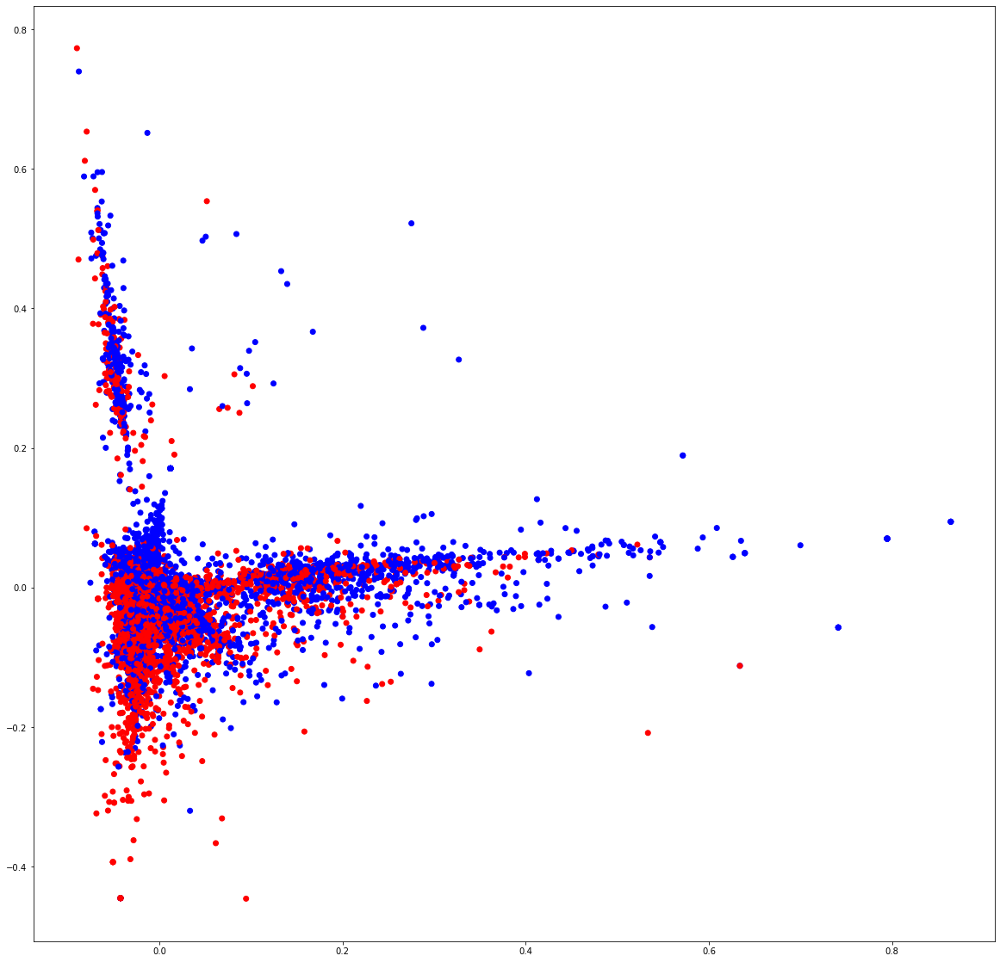

In [43]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### CNN Model #1


In [44]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [45]:
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [44]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Flatten()(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)


model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [45]:
history = model.fit(X_train, y_train, batch_size=1024, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
1245/1245 [==============================] - 897s 721ms/step - loss: 0.5181 - accuracy: 0.7408 - val_loss: 0.5016 - val_accuracy: 0.7541
Epoch 2/10
1245/1245 [==============================] - 775s 623ms/step - loss: 0.4897 - accuracy: 0.7625 - val_loss: 0.4815 - val_accuracy: 0.7702
Epoch 3/10
1245/1245 [==============================] - 865s 695ms/step - loss: 0.4793 - accuracy: 0.7694 - val_loss: 0.4739 - val_accuracy: 0.7746
Epoch 4/10
1245/1245 [==============================] - 865s 694ms/step - loss: 0.4737 - accuracy: 0.7731 - val_loss: 0.4704 - val_accuracy: 0.7752
Epoch 5/10
1245/1245 [==============================] - 842s 676ms/step - loss: 0.4696 - accuracy: 0.7752 - val_loss: 0.4733 - val_accuracy: 0.7752
Epoch 6/10
1245/1245 [==============================] - 753s 605ms/step - loss: 0.4664 - accuracy: 0.7773 - val_loss: 0.4693 - val_accuracy: 0.7780
Epoch 7/10
1245/1245 [==============================] - 750s 603ms/step - loss: 0.4643 - accuracy: 0.7789 - val_

In [46]:
model.save('models/cnn_model.h5')

In [46]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

In [48]:
load_model = tf.keras.models.load_model('models/cnn_model.h5')

# Check its architecture
load_model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 30, 300)           87137400  
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 30, 300)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 26, 64)            96064     
_________________________________________________________________
dense (Dense)                (None, 26, 512)           33280     
_________________________________________________________________
dropout (Dropout)            (None, 26, 512)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 26, 512)          

Text(0.5, 0, 'epoch')

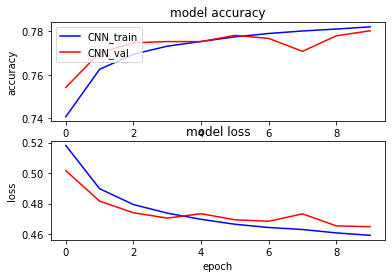

In [51]:
plt1, (plt2, plt3) = plt.subplots(2,1)
plt2.plot(history.history['accuracy'], c= 'blue')
plt2.plot(history.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['CNN_train', 'CNN_val'], loc='upper left')

plt3.plot(history.history['loss'], c='blue')
plt3.plot(history.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')

In [52]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 44s 1s/step


#### Confusion Matrix

[[124059  35434]
 [ 34587 124386]]


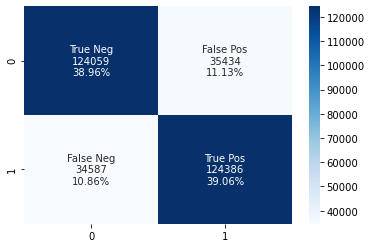

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)


#sns.heatmap(cf_matrix, annot=True)
#sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')
labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
#sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [54]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.78      0.78      0.78    159493
    Positive       0.78      0.78      0.78    158973

    accuracy                           0.78    318466
   macro avg       0.78      0.78      0.78    318466
weighted avg       0.78      0.78      0.78    318466



### CNN Model #2


In [47]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(32, 5, activation='relu')(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = MaxPooling1D(pool_size=2)(x)
x = Flatten()(x)
outputs = Dense(1, activation='sigmoid')(x)
model2 = tf.keras.Model(sequence_input, outputs)


model2.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [48]:
history2 = model2.fit(X_train, y_train, batch_size=512, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
2489/2489 [==============================] - 460s 185ms/step - loss: 0.5215 - accuracy: 0.7389 - val_loss: 0.4899 - val_accuracy: 0.7637
Epoch 2/10
2489/2489 [==============================] - 422s 170ms/step - loss: 0.4952 - accuracy: 0.7593 - val_loss: 0.4939 - val_accuracy: 0.7639
Epoch 3/10
2489/2489 [==============================] - 431s 173ms/step - loss: 0.4883 - accuracy: 0.7639 - val_loss: 0.4880 - val_accuracy: 0.7661
Epoch 4/10
2489/2489 [==============================] - 462s 186ms/step - loss: 0.4843 - accuracy: 0.7663 - val_loss: 0.4816 - val_accuracy: 0.7725
Epoch 5/10
2489/2489 [==============================] - 422s 170ms/step - loss: 0.4820 - accuracy: 0.7677 - val_loss: 0.4816 - val_accuracy: 0.7729
Epoch 6/10
2489/2489 [==============================] - 432s 174ms/step - loss: 0.4800 - accuracy: 0.7693 - val_loss: 0.4793 - val_accuracy: 0.7713
Epoch 7/10
2489/2489 [==============================] - 354s 142ms/step - loss: 0.4783 - accuracy: 0.7702 - val_

In [51]:
model2.save('../models/cnn_model2.h5')

In [54]:
load_model2 = tf.keras.models.load_model('../models/cnn_model2.h5')

# Check its architecture
load_model2.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 30, 300)           87137400  
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 30, 300)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 26, 32)            48032     
_________________________________________________________________
dense (Dense)                (None, 26, 256)           8448      
_________________________________________________________________
dropout (Dropout)            (None, 26, 256)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 26, 256)          

Text(0.5, 0, 'epoch')

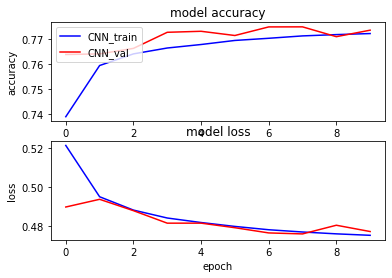

In [57]:
plt1, (plt2, plt3) = plt.subplots(2,1)
plt2.plot(history2.history['accuracy'], c= 'blue')
plt2.plot(history2.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['CNN_train', 'CNN_val'], loc='upper left')

plt3.plot(history2.history['loss'], c='blue')
plt3.plot(history2.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')

In [59]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model2.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 20s 632ms/step


#### Confusion Matrix

[[115824  43669]
 [ 28499 130474]]


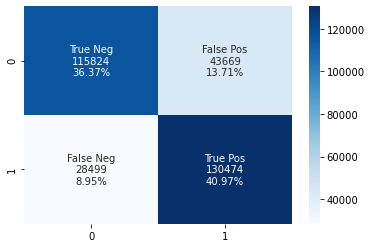

In [60]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

#Get the confusion matrix
cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)


#sns.heatmap(cf_matrix, annot=True)
#sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True, fmt='.2%', cmap='Blues')
labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
#sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [61]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.80      0.73      0.76    159493
    Positive       0.75      0.82      0.78    158973

    accuracy                           0.77    318466
   macro avg       0.78      0.77      0.77    318466
weighted avg       0.78      0.77      0.77    318466

